In [1]:
#import google drive
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [2]:
#unzip database
import zipfile
#/content/drive/MyDrive/DCC - Diego Villatoro Gerónimo/Datos Tesis Referencia/Datasets
zip_ref = zipfile.ZipFile("/content/drive/MyDrive/DCC - Diego Villatoro Gerónimo/Datos Tesis Referencia/Datasets/Agaves500.zip", 'r')
zip_ref.extractall("/content")
zip_ref.close()

In [3]:
!pip install opencv-python
!pip install opencv-contrib-python
!pip install opencv-python-headless
!pip install opencv-contrib-python-headless
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.2/55.2 MB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.6/20.6 MB 79.9 MB/s eta 0:00:00


In [4]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import os
from skimage import io  #to read double values from tif file images
from matplotlib import pyplot as plt
import PIL
import rasterio as rio  #to read full map
import pandas as pd
#from skimage.feature import peak_local_max
from skimage.measure import label
from sklearn.metrics import confusion_matrix
from PIL import Image
import seaborn as sb

#<font color= Blue>Important Functions</font>

##<font color= Green>testing</font>

In [5]:
#find valley in a histogram with n values greater before and n values greater after
def find_valleys(hist, n):
  valleys = []
  for i in range(n, len(hist)-n):
    flag = 0
    i_tmp = i-n
    while(i_tmp<i):
      #if hist[i_tmp]>hist[i_tmp+1]:
      if hist[i_tmp]>hist[i_tmp+1] or (hist[i_tmp]>0.95*hist[i_tmp+1] and hist[i_tmp]>hist[i]):
        i_tmp+=1
      else:
        flag=1
        break
    if flag==0:
      i_tmp = i+n
      while(i_tmp>i):
        #if hist[i_tmp-1]<hist[i_tmp]:
        if hist[i_tmp-1]<hist[i_tmp] or (hist[i_tmp]>0.95*hist[i_tmp-1] and hist[i_tmp]>hist[i]):
          i_tmp-=1
        else:
          flag=1
          break
    else:
      continue
    if flag==0:
      #print(i)
      valleys.append(i)
  return valleys

In [6]:
#find peaks in a histogram with n values smaller before and n values smaller after
def find_peaks(hist, n):
  peaks = []
  for i in range(n, len(hist)-n):
    flag = 0
    i_tmp = i-n
    while(i_tmp<i):
      #previous value is smaller than next or the next value is slighly small but even small than expected peak
      if hist[i_tmp]<hist[i_tmp+1] or (hist[i_tmp]<1.05*hist[i_tmp+1] and hist[i_tmp]<hist[i]):
        i_tmp+=1
      else:
        flag=1
        break
    if flag==0:
      i_tmp = i+n
      while(i_tmp>i):
        if hist[i_tmp-1]>hist[i_tmp] or (hist[i_tmp]<1.05*hist[i_tmp-1] and hist[i_tmp]<hist[i]):
          i_tmp-=1
        else:
          flag=1
          break
    else:
      continue
    if flag==0:
      #print(i)
      peaks.append(i)

##<font color= Green>Evaluations</font>

In [7]:
#read B, G, R, Re, NIR channels and target from database
def read_channels(imNumber):
  ######### READ DATA FROM DATABASE #########
  B = io.imread('/content/Agaves500/Data/Blue/'+imNumber+'.tif')
  B = B/0.54 #scale to be in range 0-1

  G = io.imread('/content/Agaves500/Data/Green/'+imNumber+'.tif')
  G = G/0.54 #scale to be in range 0-1

  R = io.imread('/content/Agaves500/Data/Red/'+imNumber+'.tif')
  R = R/0.54 #scale to be in range 0-1

  Re = io.imread('/content/Agaves500/Data/Red edge/'+imNumber+'.tif')
  Re = Re/0.54 #scale to be in range 0-1

  NIR = io.imread('/content/Agaves500/Data/NIR/'+imNumber+'.tif')
  NIR = NIR/0.54 #scale to be in range 0-1

  target = np.asarray(PIL.Image.open('/content/Agaves500/Label/'+imNumber+'.png')).reshape(500,500,1)

  return B, G, R, Re, NIR, target

###Shadows

In [8]:
def F(x, a, y, b):
  return 1/(1+np.exp(-a*(1-x**(1/y)-b)))

def maxim(R, G, B):
  M = np.maximum(np.maximum(R, G), B)
  return M

def minim(a, t):
  M = np.where(a<t, a, t)
  return M

#Recive channels R, G, B, and NIR to compute the shadow map, if bin is enable return binarized shadow map, else return it in grayscale
#The values are from 0 to 1
def get_shadow_map(B, G, R, NIR, bin=False):
  #It is important to define F, mini and maxi functions
  a = 14#14 #for more sensitivity decrease value
  y = 2.2#2.2 #for more sensitivity decrease value
  b = 0.5#0.5 #for more sensitivity decrease value
  c = 10# 10

  I = (R + G + B)/3

  #Normalize values of I and NIR before compute funtion F to get values from 0 to 1
  # Visible shadow candidate map
  d_VIS = F(I/I.max(), a, y, b)
  #NIR shadow candidate map
  d_NIR = F(NIR/NIR.max(), a, y, b)
  D = d_VIS*d_NIR

  T_R = R/(NIR+0.000000000001)#add small small number to avoid division by 0
  T_G = G/(NIR+0.000000000001)
  T_B = B/(NIR+0.000000000001)
  T = minim( maxim(T_R, T_G, T_B), c)/c #return values from 0 to 1

  U = (1-D)*(1-T)

  if bin:
    # Applying Otsu's method setting the flag value into cv.THRESH_OTSU.
    # Optimal threshold value is determined automatically.
    otsu_threshold, U_bin = cv2.threshold((255*U).astype('uint8'), 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # Dischard border pixels that does not contain image information
    #because inverse threshold is applied, when image has borders outside, these become 1's
    out_img_indices = np.where(np.logical_and(np.logical_and(R==0, G==0), B==0))
    U_bin[out_img_indices] = 0
    #ret,U_bin = cv2.threshold(U,otsu_threshold/255,1,cv2.THRESH_BINARY_INV)
    return (U_bin/255).astype('uint8')
  else:
    return U

###VI

In [9]:
#bands are between 0 and 1, the returned VI is also between 0 and 1
def VI(bands, vi_name, norm = False, bounded = True):
  B = bands[0]
  G = bands[1]
  R = bands[2]
  Re = bands[3]
  NIR = bands[4]
  V_I = np.zeros_like(R)
  if vi_name == 'RVI':#rango abierto (0-INF) rango particular (0 - 2.7) rango acotado(0, 1)
    V_I = np.divide(R, NIR, out=np.zeros_like(R), where=NIR!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 0.999) #set little small to 1 to avoid overflow in uin8
      #V_I = V_I/2.7
  elif vi_name == 'VIN':#rango abierto (0-INF) rango particular (0 - 32), rango acotado (0,15)
    V_I = np.divide(NIR, R, out=np.zeros_like(R), where=R!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 14.999)
      V_I = V_I/15
  elif vi_name == 'NDVI': #rango (-1-1), rango particular (-0.5 - 1.0)
    V_I = np.divide(NIR-R, NIR+R, out=np.zeros_like(R)-0.5, where=(NIR+R)!=0)
    if bounded:
      V_I = (V_I+0.5)/1.5
  elif vi_name == 'PVI1': #rango (-0.385-0.923)   rango particular (-0.1 - 0.8)
    #a = 2.4
    #b = 0.01
    #V_I = (a*NIR-R-b)/np.sqrt(a**2+1)
    #V_I = 0.923*NIR-0.385*R
    V_I = np.add(0.923*NIR, -0.385*R, out=np.zeros_like(R)-0.1, where=((NIR+R)!=0))
    if bounded:
      V_I = (V_I+0.1)/0.9
  elif vi_name == 'PVI2': #rango (-0.676-0.737) rango particula (-0.1 - 0.4)
    #a = 1.091
    #b = 5.49
    #V_I = (a*Re-R-b)/np.sqrt(a**2+1)
    V_I = np.add(0.737*Re, -0.676*R, out=np.zeros_like(R)-0.1, where=((Re+R)!=0))
    if bounded:
      V_I = (V_I+0.1)/0.5
  elif vi_name == 'SAVI': #rango (-1-1) rango particular (-0.3 - 0.8)
    #L = 0.5
    #V_I = ((NIR-R)/(NIR+R+0.5))*(1.5)
    V_I = np.divide(1.5*(NIR-R), NIR+R+0.5, out=np.zeros_like(R)-0.3, where=(NIR+R)!=0)
    if bounded:
      V_I = (V_I+0.3)/1.1
  elif vi_name == 'TSAVI1':#rango abierto (-INF-INF) rango acotado(-5, 5)
    a = 1.3
    b = 0.06
    #V_I = (a*(NIR-a*R-b))/(a*NIR+R-a*b)
    V_I = np.divide(a*(NIR-a*R-b), a*NIR+R-a*b, out=np.zeros_like(R)-5, where=np.logical_and((NIR+R)!=0, (a*NIR+R-a*b)!=0))
    if bounded:
      V_I = np.clip(V_I, -5, 4.999) #values greater to 1 are limit to 1
      V_I = (V_I+5)/10
  elif vi_name == 'TSAVI2':#rango abierto (-INF-INF)  rango particular (-0.71 - 0.7) rango acotado (-0.4-0.5)
    a = 1.3
    b = 0.06
    #V_I = (a*(NIR-a*R-b))/(a*NIR+R-a*b+0.08*(1+a**2))
    V_I = np.divide(a*(NIR-a*R-b), a*NIR+R-a*b+0.08*(1+a**2), out=np.zeros_like(R)-0.4, where=(NIR+R)!=0)
    if bounded:
      V_I = np.clip(V_I, -0.4, 0.499) #values greater to 1 are limit to 1
      V_I = (V_I+0.4)/0.9
  elif vi_name == 'NDGI': #rango (-1-1) rango particular (-0.9 - 1)
    V_I = np.divide(G-R, G+R, out=np.zeros_like(R)-0.9, where=(G+R)!=0)
    if bounded:
      V_I = (V_I+0.9)/1.9
  elif vi_name == 'RI':#rango (-1-1) rango particular (-1.0 - 0.9)
    V_I = np.divide(R-G, R+G, out=np.zeros_like(R)-1, where=(R+G)!=0)
    if bounded:
      V_I = (V_I+1)/1.9
  elif vi_name == 'RI_NDVI':  #rango (-1.45-1.45) rango particular (-1 - 1.45)
    k = 0.45
    NDVI = np.divide(NIR-R, NIR+R, out=np.zeros_like(R), where=(NIR+R)!=0)
    RI = np.divide(R-G, R+G, out=np.zeros_like(R), where=(R+G)!=0)
    #V_I = NDVI-k*RI
    V_I = np.add(NDVI, -k*RI, out=np.zeros_like(R)-1, where=((NDVI)!=0))
    if bounded:
      V_I = (V_I+1.0)/2.45
  elif vi_name == 'RI_SAVI': #rango (-1.26-1.26) rango particular (-1.24 - 0.8)
    k = 0.26
    #L = 0.5
    SAVI = np.divide(1.5*(NIR-R), NIR+R+0.5, out=np.zeros_like(R), where=(NIR+R)!=0)
    RI = np.divide(R-G, R+G, out=np.zeros_like(R), where=(R+G)!=0)
    #V_I = SAVI-k*RI
    V_I = np.add(SAVI, -k*RI, out=np.zeros_like(R)-1.24, where=((SAVI)!=0))
    if bounded:
      V_I = (V_I+1.24)/2.04
  elif vi_name == 'ARVI': #rango (-INF, INF) rango particular (-0.6-11) rango acotado (0-1)
    y=0.5
    RB = R-y*(B-R)
    V_I = np.divide(NIR-RB, NIR+RB, out=np.zeros_like(R), where=np.logical_and((NIR+R)!=0, (NIR+RB)!=0))
    if bounded:
      V_I = np.clip(V_I, 0, 0.999)
      #V_I = (V_I+0.6)/11.6
  elif vi_name == 'NDCI':#rango (-1-1) rango particular (-0.8 - 0.9)
    V_I = np.divide(Re-R, Re+R, out=np.zeros_like(R)-0.8, where=(Re+R)!=0)
    if bounded:
      V_I = (V_I+0.8)/1.7
  elif vi_name == 'MSAVI':#rango (-1-1 o 1.5)? rango particular (-0.2 - 0.8)
    #V_I = (2*NIR+1-np.sqrt((2*NIR+1)**2-8*(NIR-R)))/2
    V_I = np.divide(2*NIR+1-np.sqrt((2*NIR+1)**2-8*(NIR-R)), 2, out=np.zeros_like(R)-0.2, where=(NIR+R)!=0)
    if bounded:
      V_I = (V_I+0.2)
  elif vi_name == 'NLI':#rango (-1-1) rango particular (-1 - 0.9)
    V_I = np.divide(NIR**2-R, NIR**2+R, out=np.zeros_like(R)-1, where=(NIR+R)!=0)
    if bounded:
      V_I = (V_I+1)/1.9
  elif vi_name == 'RDVI':#rango (-1-1) rango particular (-0.3, 0.7)
    V_I = np.divide(NIR-R, np.sqrt(NIR+R), out=np.zeros_like(R)-0.3, where=(np.sqrt(NIR+R))!=0)
    if bounded:
      V_I = (V_I+0.3)
  elif vi_name == 'ExG': #rango (-2, 2) rango particular (-0.7, 0.9)
    #V_I = 2*G-R-B
    V_I = np.add(2*G, -R-B, out=np.zeros_like(R)-0.7, where=((R+G+B)!=0))
    if bounded:
      V_I = (V_I+0.7)/1.6
  elif vi_name == 'NDWI':
    V_I = np.divide(G-NIR, G+NIR, out=np.zeros_like(R)-1, where=(G+NIR)!=0)
    if bounded:
      V_I = (V_I+1.0)/2.0
  elif vi_name == 'GNDVI': #rango (-1-1) rango particular (-0.7 - 1)
    V_I = np.divide(NIR-G, NIR+G, out=np.zeros_like(R)-0.7, where=(NIR+G)!=0)
    if bounded:
      V_I = (V_I+0.7)/1.7
  elif vi_name == 'OSAVI': #rango (-1, 1) rango particular (-0.3 - 0.7)
    #V_I = (NIR-R)/(NIR+R+0.16)
    V_I = np.divide(NIR-R, NIR+R+0.16, out=np.zeros_like(R)-0.3, where=(NIR+R)!=0)
    if bounded:
      V_I = (V_I+0.3)
  elif vi_name == 'MSR': #rango (-1, INF) rango particular (-0.4 - 4.7) rango acotado (0 - 2.8)
    #V_I = (NIR/R-1)/(np.sqrt(NIR/R)+1)
    V_I = np.divide(NIR-R, R+np.sqrt(NIR*R), out=np.zeros_like(R), where=R+np.sqrt(NIR*R)!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 2.799)
      V_I = (V_I)/2.8
  elif vi_name == 'SIPI': #rango (-INF, INF)
    V_I = np.divide(NIR-B, NIR-R, out=np.zeros_like(R), where=(NIR-R)!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 3.099)
      V_I = (V_I)/3.1
  elif vi_name == 'ExR': #rango (-1-1.3) rango particular (-0.4 - 0.4)
    #V_I = 1.3*R-G
    V_I = np.add(1.3*R, -G, out=np.zeros_like(R)-0.4, where=((R+G)!=0))
    if bounded:
      V_I = (V_I+0.4)/0.8
  elif vi_name == 'MCARI': #rango(-INF-INF) rango particular (-0.2 - 2.7) rango acotado (-0.1-0.9)
    V_I = np.divide((Re-R-0.2*(Re-G))*Re, R, out=np.zeros_like(R)-0.1, where=(R)!=0)
    if bounded:
      V_I = np.clip(V_I, -0.1, 0.899)
      V_I = (V_I+0.1)
  elif vi_name == 'NDRE':  #rango (-1-1) rango particular (-0.6 - 0.9)
    V_I = np.divide(NIR-Re, NIR+Re, out=np.zeros_like(R)-0.6, where=(NIR+Re)!=0)
    if bounded:
      V_I = (V_I+0.6)/1.5
  elif vi_name == 'TVI': #rango (-100, 100) rango particular (-14 - 39)
    #V_I = 0.5*(120*(NIR-G)-200*(R-G))
    V_I = np.add(60*NIR+40*G, -100*R, out=np.zeros_like(R)-14, where=((NIR+R+G)!=0))
    if bounded:
      V_I = (V_I+14)/53
  elif vi_name == 'ARI': #rango (-INF, INF) rango particular (-121 - 359) rango acotado (-10, 86)
    #V_I = 1/G-1/Re
    V_I = np.divide(Re-G, G*Re, out=np.zeros_like(R)-10, where=(G*Re)!=0)
    if bounded:
      V_I = np.clip(V_I, -10, 85.999)
      V_I = (V_I+10)/96
  elif vi_name == 'EVI': #rango (-INF, INF) rango particular (-372637 - 1416), rango acotado (0, 1.25)
    L = 1
    c1 = 6
    c2 = 7.5
    g = 2.5
    V_I = g*(NIR-R)/(NIR+c1*R-c2*B+L)
    #V_I = np.divide(g*(NIR-R), NIR+c1*R-c2*B+L, out=np.zeros_like(R), where=(NIR+R+B)!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 1.249)
      V_I = (V_I)/1.25
  elif vi_name == 'CIVE': #rango(18 - 20) rango particular(18.4 - 19.1)
    #V_I = 0.441*R-0.811*G+0.385*B+18.78745
    V_I = np.add(0.441*R, -0.811*G+0.385*B+18.78745, out=np.zeros_like(R)+18.4, where=((R+G+B)!=0))
    if bounded:
      V_I = (V_I-18.4)/0.7
  elif vi_name == 'NRI': #rango(0-1), rango particular (0.0-0.8)
    V_I = np.divide(R, R+G+B, out=np.zeros_like(R), where=(R+G+B)!=0)
    if bounded:
      V_I = (V_I)/0.8
  elif vi_name == 'NGI': #rango(0-1), rango particular (0.0-0.92)
    V_I = np.divide(G, R+G+B, out=np.zeros_like(R), where=(R+G+B)!=0)
    if bounded:
      V_I = (V_I)/0.92
  elif vi_name == 'NBI': #rango(0-1), rango particular (0.0-0.85)
    V_I = np.divide(B, R+G+B, out=np.zeros_like(R), where=(R+G+B)!=0)
    if bounded:
      V_I = (V_I)/0.85
  elif vi_name == 'CCCI': #rango (-INF, INF) rango particular (-73005 - 263474) rango de datos (0, 1.7)
    NDRE = np.divide(NIR-Re, NIR+Re, out=np.zeros_like(R), where=(NIR+Re)!=0)
    NDVI = np.divide(NIR-R, NIR+R, out=np.zeros_like(R), where=(NIR+R)!=0)
    V_I = np.divide(NDRE, NDVI, out=np.zeros_like(R), where=(NDVI)!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 1.699) #values greater to 1 are limit to 1
      V_I = (V_I)/1.7
  elif vi_name == 'CCCI2': #rango (-INF, INF) rango particular (-60594 - 218683) rango de datos (-0.375, 1.02)
    NDRE = np.divide(NIR-Re, NIR+Re, out=np.zeros_like(R), where=(NIR+Re)!=0)
    NDVI = np.divide(NIR-R, NIR+R, out=np.zeros_like(R), where=(NIR+R)!=0)
    V_I = np.divide(NDRE, NDVI, out=np.zeros_like(R), where=(NDVI)!=0)
    V_I = 0.83*V_I-0.375
    if bounded:
      V_I = np.clip(V_I, -0.375, 1.0199) #values greater to 1 are limit to 1
      V_I = (V_I+0.375)/1.395
  elif vi_name == 'EVI2': #rango (-0.74 - 1.25), rango particular (-0.2 - 0.8)
    g = 2.5
    c1 = 2.4
    L = 1
    #V_I = g*(NIR-R)/(NIR+c1*R+L)
    V_I = np.divide(g*(NIR-R), NIR+c1*R+L, out=np.zeros_like(R)-0.2, where=(NIR+R)!=0)
    if bounded:
      V_I = (V_I+0.2)
  elif vi_name == 'LCVI1':
    ARVI = VI(bands, 'ARVI', norm)
    RVI = VI(bands, 'RVI', norm)
    TSAVI2 = VI(bands, 'TSAVI2', norm)
    NDVI = VI(bands, 'NDVI', norm)
    NLI = VI(bands, 'NLI', norm)
    CCCI = VI(bands, 'CCCI', norm)
    MSR = VI(bands, 'MSR', norm)
    SIPI = VI(bands, 'SIPI', norm)
    NDCI = VI(bands, 'NDCI', norm)
    GNDVI = VI(bands, 'GNDVI', norm)
    V_I = (0.249*ARVI+0.238*RVI+0.183*TSAVI2+0.107*NDVI+0.071*NLI+0.058*CCCI+0.052*MSR+0.029*SIPI+0.009*NDCI+0.004*GNDVI)  #Best according to uniformity in histograms but weighted
  elif vi_name == 'LCVI2':
    ARVI = VI(bands, 'ARVI', norm)
    RVI = VI(bands, 'RVI', norm)
    TSAVI2 = VI(bands, 'TSAVI2', norm)
    NLI = VI(bands, 'NLI', norm)
    MSR = VI(bands, 'MSR', norm)
    V_I = 0.43*ARVI+0.148*RVI+0.227*TSAVI2+0.069*NLI+0.126*MSR #Best weighted according to combined histograms metrics
  elif vi_name == 'RCVI1':
    ARVI = VI(bands, 'ARVI', norm)
    NLI = VI(bands, 'NLI', norm)
    CCCI = VI(bands, 'CCCI', norm)
    V_I = np.divide(ARVI*NLI, CCCI, out=np.zeros_like(ARVI), where=CCCI!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 5.499)
      V_I = V_I/5.5
  elif vi_name == 'RCVI2':
    ARVI = VI(bands, 'ARVI', norm)
    TSAVI2 = VI(bands, 'TSAVI2', norm)
    RVI = VI(bands, 'RVI', norm)
    CCCI = VI(bands, 'CCCI', norm)
    V_I = np.divide(ARVI*TSAVI2*RVI, CCCI, out=np.zeros_like(ARVI), where=CCCI!=0)
    if bounded:
      V_I = np.clip(V_I, 0, 1.699)
      V_I = V_I/1.7
  elif vi_name == 'ILR1': #RANGO (-7.35 - 5.65) rango particular (-1.12, 1.84)
    V_I = np.add(2.14*B+0.24*G-7.35*R, 0.8*Re+2.15*NIR+0.32, out=np.zeros_like(R)-1.12, where=((R+G+B)!=0))
    if bounded:
      #V_I = np.clip(V_I, -0.1, 1.299)
      V_I = (V_I+1.12)/(2.96)
  elif vi_name == 'ILR2': #RANGO (-4.21 - 2.88) rango particular (-1.16-1.66)
    V_I = np.add(2.65*NIR, -4.21*R+0.23, out=np.zeros_like(R)-1.16, where=((R+G+B)!=0))
    if bounded:
      #V_I = np.clip(V_I, 0, 1.199)
      V_I = (V_I+1.16)/2.82

  #V_I = np.clip(V_I, 0, 1)
  #V_I[np.isnan(V_I)] = 0 #nan values are set to 0
  #V_I[np.isinf(V_I)] = 1 #inf values are set to 1
  if norm == True:
    V_I = (V_I-V_I.min())/(V_I.max()-V_I.min())

  return V_I.astype('float32')

###Segmentation

In [10]:
def filter_min_components(binIMG, minSize=100, it_dilate=3, it_erode=1):
  # Apply the Component analysis function
  (totalLabels, label_ids, values, centroid) = cv2.connectedComponentsWithStats(binIMG, 4, cv2.CV_32S)

  # Initialize a new image to store all the output components
  output_temp = np.zeros(binIMG.shape, dtype="uint8")

  # Loop through each component
  for i in range(1, totalLabels):
      area = values[i, cv2.CC_STAT_AREA]
      if (area > minSize):
          # Labels stores all the IDs of the components on the each pixel
          # It has the same dimension as the threshold
          # So we'll check the component
          # then convert it to 255 value to mark it white
          componentMask = (label_ids == i).astype("uint8")

          # Creating the Final output mask
          output_temp = cv2.bitwise_or(output_temp, componentMask)
  #dilate 3 times + erode 1 to improve the shape
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
  output = cv2.dilate(output_temp, kernel, iterations=it_dilate)
  output = cv2.erode(output, kernel, iterations=it_erode)
  return output

In [11]:
#fid the nearest element in the array to the given value
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

###Score

$Acc = \frac{\text{Number of correct predictions}}{\text{Total number of predictions}} = \frac{(TP+TN)}{(TP+FP+FN+TN)}$

$Acc_{class0} = \text{Specificity} = \frac{TN}{TN+FP}$

$Acc_{class1} = \text{Recall} = \frac{TP}{TP+FN}$

$IoU = \frac{\text{Intersection (Number of correct predictions)}}{\text{Union (Predictions + True values - Intersection})}$

$IoU_{class0} = \frac{TN}{TN+FN+FP}$
$IoU_{class1} = \frac{TP}{TP+FN+FP}$

$Precision = \frac{TP}{TP+FP}$

$F1 score = DICE = \frac{2TP}{2TP+FP+FN}$

In [12]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import Normalizer

def accuracy(confusion):
    # extract the number of correct guesses from the diagonal
    preds_correct = np.sum(confusion * np.eye(len(confusion)), axis=-1)
    # extract the number of total values per class from ground truth
    trues = np.sum(confusion, axis=-1)
    # calculate the total accuracy
    return np.sum(preds_correct) / np.sum(trues)

def class_accuracy(confusion: np.ndarray) -> np.ndarray:
    # extract the number of correct guesses from the diagonal
    preds_correct = np.sum(confusion * np.eye(len(confusion)), axis=-1)
    # extract the number of total values per class from ground truth
    trues = np.sum(confusion, axis=-1)
    # get per class accuracy by dividing correct by total
    return preds_correct / trues

def iou(confusion: np.ndarray) -> np.ndarray:
    """
    Returns a vector representing the per class I/U
    Reference:
        https://en.wikipedia.org/wiki/Jaccard_index
    """
    # get |intersection| (AND) from the diagonal of the confusion matrix
    intersection = (confusion * np.eye(len(confusion))).sum(axis=-1)
    # calculate the total ground truths and predictions per class
    preds = confusion.sum(axis=0)
    trues = confusion.sum(axis=-1)
    # get |union| (OR) from the predictions, ground truths, and intersection
    union = trues + preds - intersection
    # return the intersection over the union
    return intersection / union

def metrics(confusion: np.ndarray) -> tuple:
    """
    Return metrics evaluating a categorical classification task.
    Args:
        confusion: the confusion matrix between ground truth and predictions
        mask: the mask to use for the metrics
    Returns:
        a tuple of metrics for evaluation:
        -   float: the global accuracy
        -   ndarray: a vector representing the per class Accuracy
        -   ndarray: a vector representing the per class I/U
    """
    # calculate the global accuracy from the confusion matrix
    _accuracy = accuracy(confusion)
    # calculate the class accuracies from the confusion matrix
    _class_accuracy = class_accuracy(confusion)
    # calculate the per class IoUs from the confusion matrix
    _iou = iou(confusion)

    tn, fp, fn, tp = confusion.ravel()

    precision = tp/(tp+fp)
    return _accuracy*100, _class_accuracy*100, _iou*100, precision*100, tn, fp, fn, tp

#<font color= Blue>Shadow map</font>

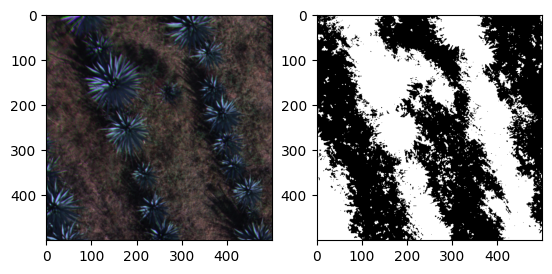

In [15]:
#'0704', '0412', '0216'
B, G, R, Re, NIR, t = read_channels('0216')
#arvi
ARVI = VI((B, G, R, Re, NIR),'ARVI')
#seg1
ret,seg = cv2.threshold((255*ARVI).astype('uint8'),131,255,cv2.THRESH_BINARY)

I = cv2.merge((R, G, B))
I = (255*I/I.max()).astype('uint8')
Im = Image.fromarray(I) #convert to pil image
Im.save("shadows.png", "PNG") #save image

Im = Image.fromarray(seg) #convert to pil image
Im.save("seg_noise.png", "PNG") #save image

plt.subplot(1, 2, 1)
#I = cv2.cvtColor(I, cv2.COLOR_RGB2GRAY)
plt.imshow(I, cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(seg, cmap='gray')


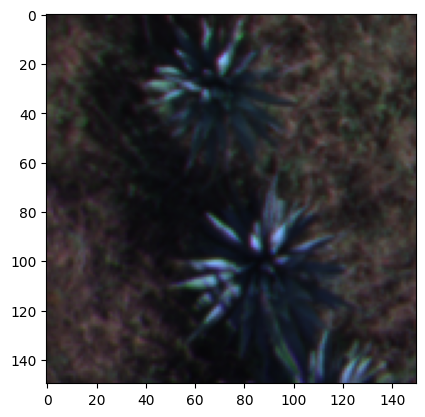

In [ ]:
imNumber = '0216'
B, G, R, Re, NIR, target = read_channels(imNumber)
Img = cv2.merge((R, G, B))
Img = ((255*Img)/Img.max()).astype('uint8')
Img = Img[325:475, 150:300]
plt.imshow(Img)
B = B[325:475, 150:300]
G = G[325:475, 150:300]
R = R[325:475, 150:300]
NIR = NIR[325:475, 150:300]
Im = Image.fromarray((255*B/B.max()).astype('uint8')) #convert to pil image
Im.save("B.png", "PNG") #save image
Im = Image.fromarray((255*G/G.max()).astype('uint8')) #convert to pil image
Im.save("G.png", "PNG") #save image
Im = Image.fromarray((255*R/R.max()).astype('uint8')) #convert to pil image
Im.save("R.png", "PNG") #save image
Im = Image.fromarray((255*NIR/NIR.max()).astype('uint8')) #convert to pil image
Im.save("NIR.png", "PNG") #save image
Im = Image.fromarray(Img) #convert to pil image
Im.save("RGB.png", "PNG") #save image

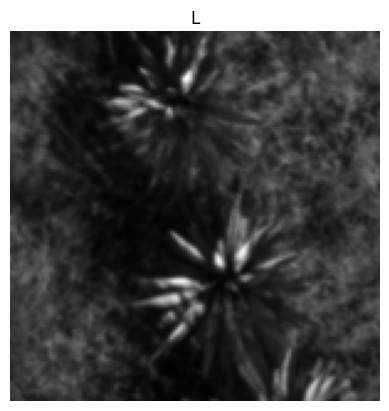

In [ ]:
L = (R + G + B)/3

plt.imshow(L, cmap='gray')
plt.title('L')
plt.axis('off')
#plt.savefig('shadowL.png')
Im = Image.fromarray((255*L/L.max()).astype('uint8')) #convert to pil image
Im.save("L.png", "PNG") #save image

$f(x) = {1}/({1+e^{-a(1-x^{1/y}-b)}})$

In [ ]:
def F(x, a, y, b):
  return 1/(1+np.exp(-a*(1-x**(1/y)-b)))

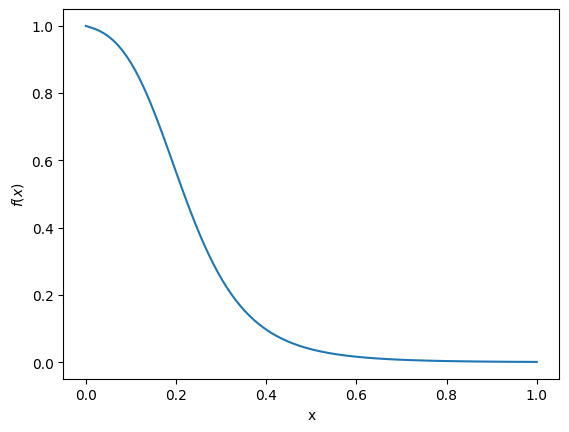

In [ ]:
x = np.linspace(0,1,100)
z = F(x, 14, 2.2, 0.5)
plt.plot(x, z)
plt.ylabel('$f(x)$')
plt.xlabel('x')
plt.savefig('shadowF.png')

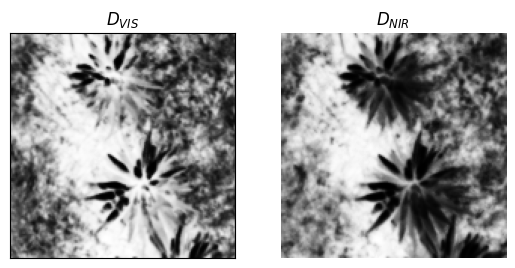

In [ ]:
a = 14#14 #for more sensitivity decrease value
y = 2.2#2.2 #for more sensitivity decrease value
b = 0.5#0.5 #for more sensitivity decrease value

#Normalize values of I and NIR before compute funtion F to get values from 0 to 1
# Visible shadow candidate map
d_VIS = F(L/L.max(), a, y, b)
#NIR shadow candidate map
d_NIR = F(NIR/NIR.max(), a, y, b)

plt.subplot(1, 2, 1)
plt.imshow(d_VIS, cmap='gray')
plt.title("$D_{VIS}$")
ax = plt.gca()
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)

plt.subplot(1, 2, 2)
plt.imshow(d_NIR, cmap='gray')
plt.title("$D_{NIR}$")
ax = plt.gca()
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.axis('off')
#plt.savefig('shadowDs.png')
Im = Image.fromarray((255*d_VIS/d_VIS.max()).astype('uint8')) #convert to pil image
Im.save("Dvis.png", "PNG") #save image
Im = Image.fromarray((255*d_NIR/d_NIR.max()).astype('uint8')) #convert to pil image
Im.save("Dnir.png", "PNG") #save image

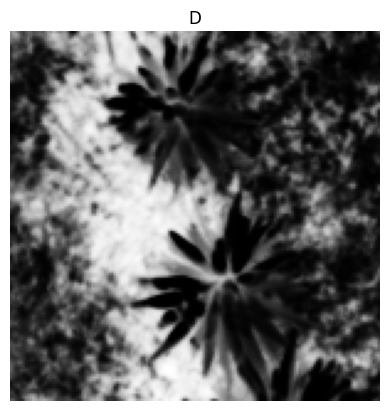

In [ ]:
D = d_VIS*d_NIR
plt.imshow(D, cmap='gray')
plt.title('D')
plt.axis('off')
#plt.savefig('shadowD.png')
Im = Image.fromarray((255*D/D.max()).astype('uint8')) #convert to pil image
Im.save("D.png", "PNG") #save image

In [ ]:
def maxim(R, G, B):
  M = np.maximum(np.maximum(R, G), B)
  return M

def minim(a, t):
  M = np.where(a<t, a, t)
  return M

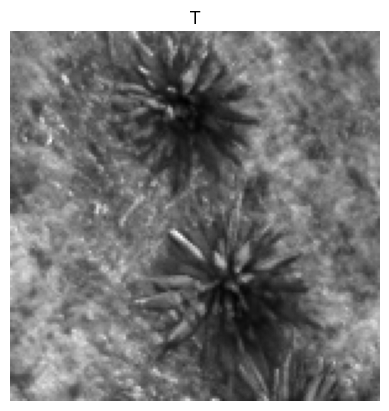

In [ ]:
c = 10# 10
T_R = R/(NIR+0.000000000001)#add small small number to avoid division by 0
T_G = G/(NIR+0.000000000001)
T_B = B/(NIR+0.000000000001)
T = minim( maxim(T_R, T_G, T_B), c)/c #return values from 0 to 1

#cv2_imshow(255*T)
plt.imshow(T, cmap='gray')
plt.title('T')
plt.axis('off')
#plt.savefig('shadowT.png')
Im = Image.fromarray((255*T/T.max()).astype('uint8')) #convert to pil image
Im.save("T.png", "PNG") #save image

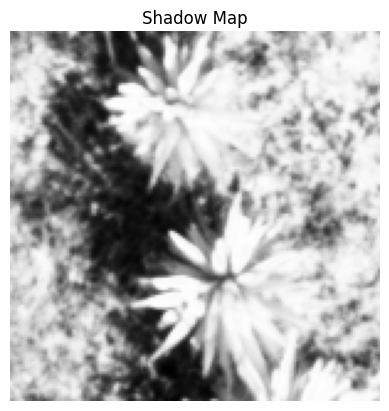

In [ ]:
U = (1-D)*(1-T)
#cv2_imshow(255*U)
plt.imshow(U, cmap='gray')
plt.title("Shadow Map")
plt.axis('off')
#plt.savefig('shadowU.png')
Im = Image.fromarray((255*U/U.max()).astype('uint8')) #convert to pil image
Im.save("U.png", "PNG") #save image

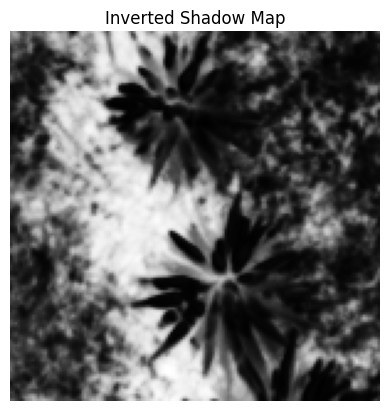

In [ ]:
U_inv = 1-U
#cv2_imshow(255*U)
plt.imshow(U_inv, cmap='gray')
plt.title("Inverted Shadow Map")
plt.axis('off')
#plt.savefig('shadowUinv.png')
Im = Image.fromarray((255*U_inv/U_inv.max()).astype('uint8')) #convert to pil image
Im.save("Uinv.png", "PNG") #save image

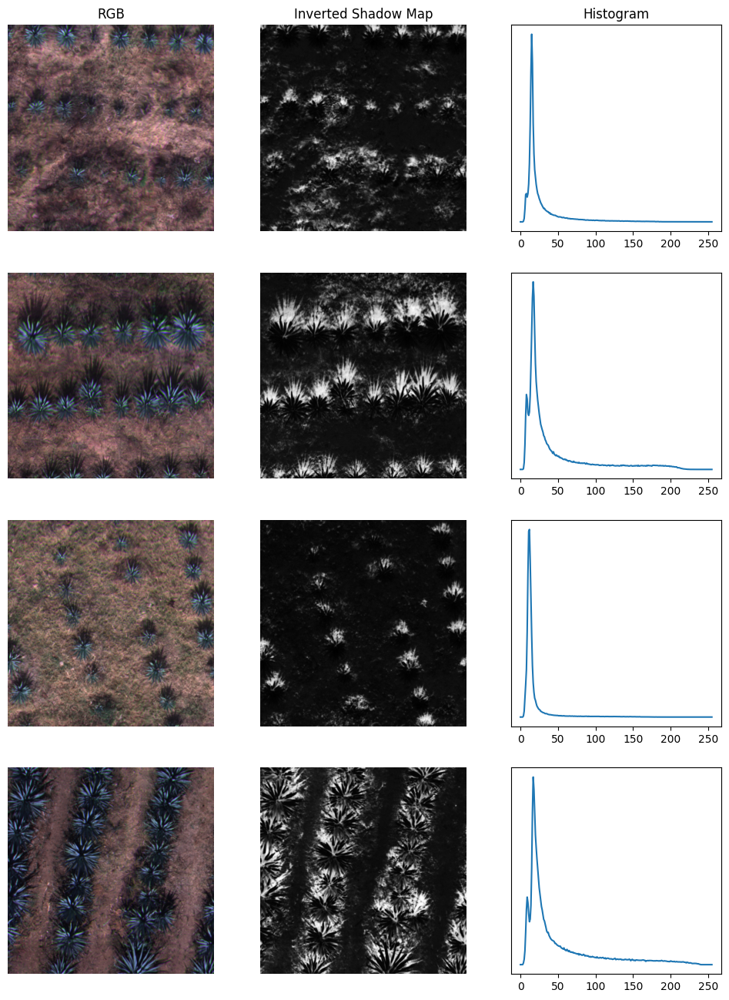

In [ ]:
im = ['0971', '0704', '0624', '0412']
plt.figure(figsize=(12,16))
for i in range(len(im)):
  B, G, R, Re, NIR, target = read_channels(im[i])
  U = get_shadow_map(B, G, R, NIR, bin=False)

  scale=255/max(B.max(), max(R.max(), G.max()))
  rgb = (scale*cv2.merge((R, G, B))).astype('uint8')

  plt.subplot(len(im), 3, 3*i+1)
  plt.imshow(rgb)
  if i==0:
    plt.title('RGB')
  plt.axis('off')

  plt.subplot(len(im), 3, 3*i+2)
  plt.imshow(1-U, cmap='gray')
  if i==0:
    plt.title('Inverted Shadow Map')
  plt.axis('off')

  tmp_hist = cv2.calcHist([(255*(1-U)).astype('uint8')], [0], None, [256], [0, 256])
  plt.subplot(len(im), 3, 3*i+3)
  plt.plot(tmp_hist)
  if i==0:
    plt.title('Histogram')
  plt.yticks([])
  #plt.axis('off')
plt.savefig('ShadowMapExamples.png')

#<font color= Blue>ARVI</font>

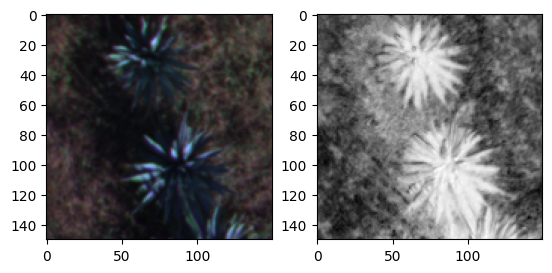

In [13]:
B, G, R, Re, NIR, t = read_channels('0216')
B = B[325:475, 150:300]
G = G[325:475, 150:300]
R = R[325:475, 150:300]
NIR = NIR[325:475, 150:300]
#B, G, R, Re, NIR, t = read_channels('0647')
##Img 1
scale = 255/(max(R.max(), max(G.max(), B.max())))
rgb = (scale*cv2.merge((R, G, B))).astype('uint8')
#Img 2
ARVI = VI((B, G, R, Re, NIR),'ARVI')
ARVI = ((255*ARVI)/ARVI.max()).astype('uint8')

plt.subplot(1, 2, 1)
plt.imshow(rgb)
plt.subplot(1, 2, 2)
plt.imshow(ARVI, cmap='gray')

Im = Image.fromarray(rgb) #convert to pil image
Im.save("RGB.png", "PNG") #save image
Im = Image.fromarray(ARVI) #convert to pil image
Im.save("ARVI.png", "PNG") #save image

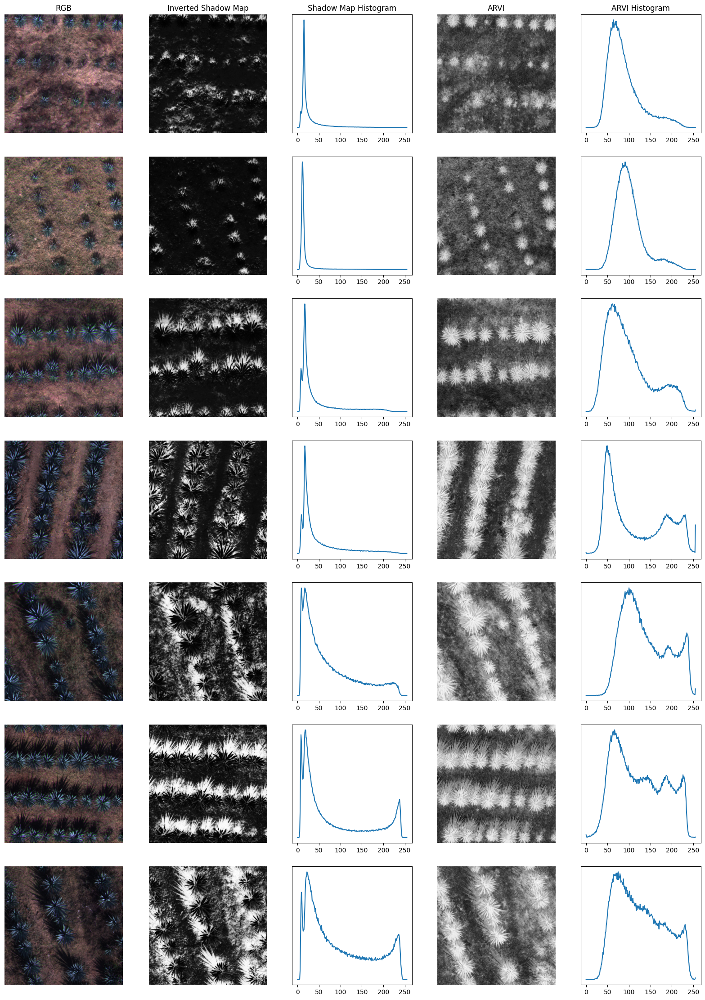

In [ ]:
im = ['0971', '0624', '0704', '0412', '0216', '0896', '0152']
plt.figure(figsize=(5*4,len(im)*4))
for i in range(len(im)):
  B, G, R, Re, NIR, target = read_channels(im[i])
  U = get_shadow_map(B, G, R, NIR, bin=False)

  #Img 1
  scale=255/max(B.max(), max(R.max(), G.max()))
  rgb = (scale*cv2.merge((R, G, B))).astype('uint8')

  #Img 2
  ARVI = VI((B, G, R, Re, NIR),'ARVI')
  ARVI = ((255*ARVI)/ARVI.max()).astype('uint8')

  plt.subplot(len(im), 5, 5*i+1)
  plt.imshow(rgb)
  if i==0:
    plt.title('RGB')
  plt.axis('off')

  plt.subplot(len(im), 5, 5*i+2)
  plt.imshow(1-U, cmap='gray')
  if i==0:
    plt.title('Inverted Shadow Map')
  plt.axis('off')

  tmp_hist = cv2.calcHist([(255*(1-U)).astype('uint8')], [0], None, [256], [0, 256])
  plt.subplot(len(im), 5, 5*i+3)
  plt.plot(tmp_hist)
  if i==0:
    plt.title('Shadow Map Histogram')
  plt.yticks([])

  plt.subplot(len(im), 5, 5*i+4)
  plt.imshow(ARVI, cmap='gray')
  if i==0:
    plt.title('ARVI')
  plt.axis('off')

  tmp_hist = cv2.calcHist([ARVI], [0], None, [256], [0, 256])
  plt.subplot(len(im), 5, 5*i+5)
  plt.plot(tmp_hist)
  if i==0:
    plt.title('ARVI Histogram')
  plt.yticks([])

plt.savefig('ShadowMapExamples.png')

In [ ]:
def get_total_hist_VI(VI_NAME, len_histo, min_histo, max_histo, pData=0.999, bounded=True, verbose=True):
  maxi = -np.inf
  mini = np.inf
  _hist = np.zeros((len_histo, 1))

  with open('/content/Agaves500/splits/train.txt') as f:
    images = f.read().splitlines()

  for i in range(len(images)):
      B, G, R, Re, NIR, target = read_channels(images[i])

      norm =False
      Veg_Ind = VI((B, G, R, Re, NIR), VI_NAME, norm, bounded)
      _hist += cv2.calcHist([Veg_Ind], [0], None, [len_histo], [min_histo, max_histo])

      if Veg_Ind.max()>maxi:
        maxi = Veg_Ind.max()
      if Veg_Ind.min()<mini:
        mini = Veg_Ind.min()

  #ESTIMATE MAX AND MIN VALUES FOR VI'S WITHOUT DEFINED BOUNDARIES
  totalNpixels = sum(_hist) #len(images)*len(R)*len(R[0])
  x = np.linspace(min_histo, max_histo, len_histo)
  for j in range(len(_hist)):
    if sum(_hist[j:])/(totalNpixels) < pData:
      break
  for i in range(len(_hist)):
    if sum(_hist[:i])/(totalNpixels) > pData:
      break
  miniRecommended = x[j-1]
  maxiRecommended = x[i]
  if verbose:
    print("Min: %.4f, Max: %.5f" %(mini, maxi))
    print("Min limit recommended %4.6f in index %d" %(x[j-1], j-1))
    print("Max limit recommended %4.6f in index %d" %(x[i], i))
    plt.plot(_hist)
  return (mini, maxi), _hist, (miniRecommended, maxiRecommended)

Min: -0.5766, Max: 10.95158
Min limit recommended -0.006130 in index 152
Max limit recommended 0.974537 in index 403


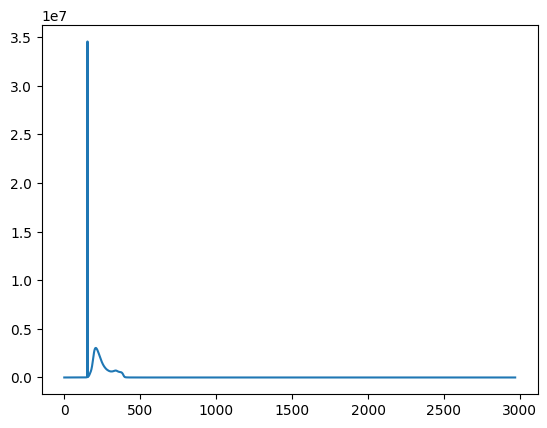

In [ ]:
len_histo = int(np.ceil(256*11.6))
min_histo = -0.6
max_histo = 11
VI_NAME = 'ARVI'

(mini, maxi), _hist, (miniRecommended, maxiRecommended) = get_total_hist_VI(VI_NAME, len_histo, min_histo, max_histo, bounded=False)

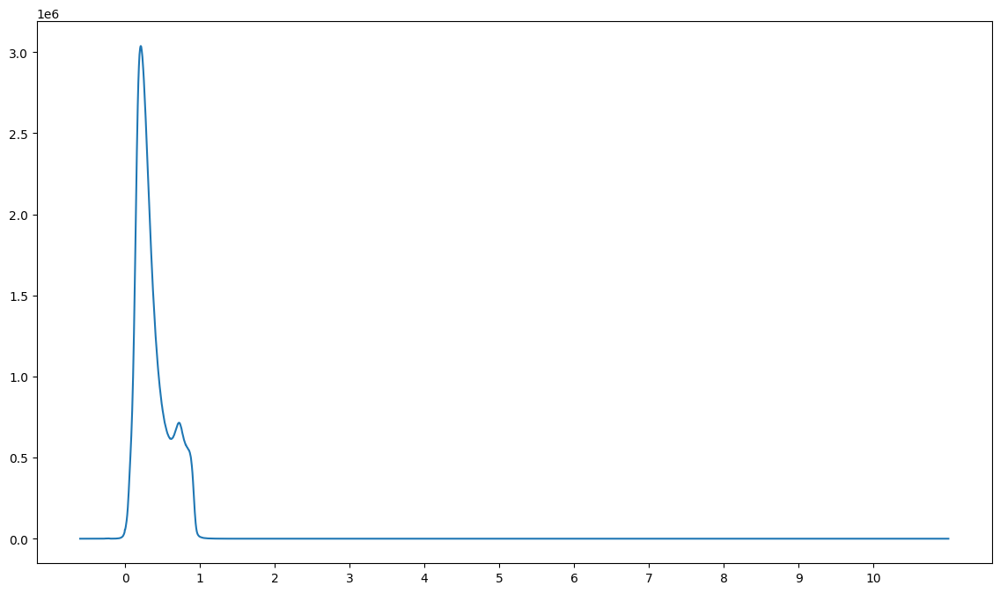

In [ ]:
plt.figure(figsize=(14,8))
x = np.linspace(-0.6, 11, len_histo)
_hist[153] = _hist[154]
plt.plot(x, _hist)
plt.xticks([0,1,2,3,4,5,6,7,8,9,10, 11])
plt.savefig('arvi_unbounded.png')

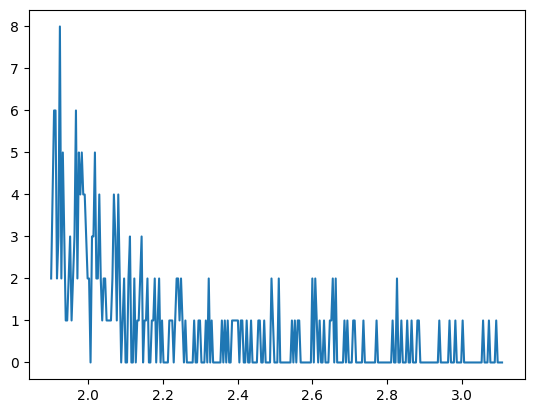

In [ ]:
plt.plot(x[640:950], _hist[640:950])
plt.savefig('arvi_unbounded_noise.png')

#<font color= Blue>Shadow Improvement</font>

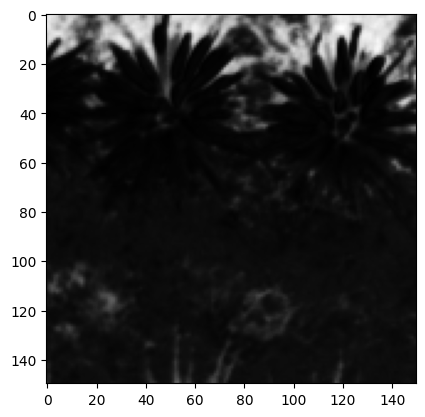

In [38]:
B, G, R, Re, NIR, t = read_channels('0647')
#B, G, R, Re, NIR, t = read_channels('0216')
S = -100
B = B[325-100:475-100, 150-S:300-S]
G = G[325-100:475-100, 150-S:300-S]
R = R[325-100:475-100, 150-S:300-S]
NIR = NIR[325-100:475-100, 150-S:300-S]
U = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
Uinv = 1-U
plt.imshow(Uinv, cmap='gray')
Im = Image.fromarray(((255*Uinv)/Uinv.max()).astype('uint8')) #convert to pil image
Im.save("Uinv2.png", "PNG") #save image

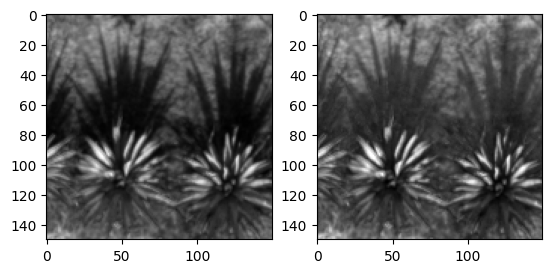

In [39]:
Im = cv2.merge((B, G, R))
HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(HSV)
newV = np.clip(V*(1+2*(Uinv)), V.min(), V.max())

plt.subplot(1, 2, 1)
plt.imshow(V, cmap='gray')
plt.subplot(1, 2, 2)
plt.imshow(newV, cmap='gray')

Im = Image.fromarray(((255*V)/V.max()).astype('uint8')) #convert to pil image
Im.save("V.png", "PNG") #save image
Im = Image.fromarray(((255*newV)/newV.max()).astype('uint8')) #convert to pil image
Im.save("newV.png", "PNG") #save image

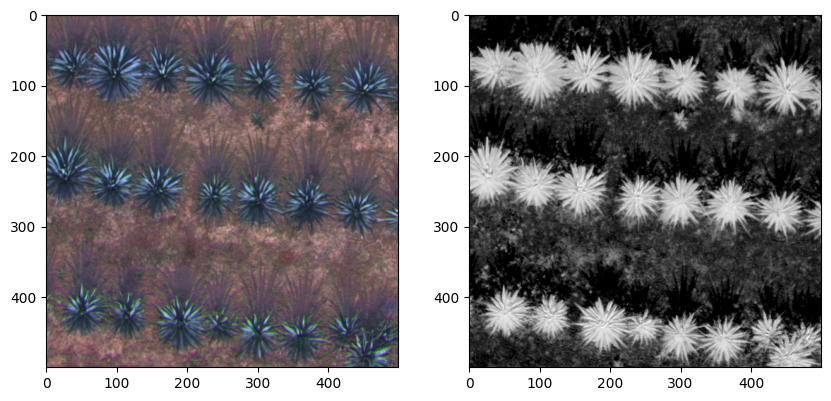

In [ ]:
newI = cv2.cvtColor(cv2.merge((H, S, newV)), cv2.COLOR_HSV2RGB)
newR, newG, newB = cv2.split(newI)

scale = 255/(newI.max())
new = (scale*newI).astype('uint8')
ARVI2 = VI((newB, newG, newR, Re, NIR),'ARVI')

plt.figure(figsize=(10,10))
plt.subplot(1, 2, 1)
plt.imshow(new)
plt.subplot(1, 2, 2)
plt.imshow(ARVI2, cmap='gray')

#<font color= Blue>Segmentation</font>

In [ ]:
len_histo=256
min_histo = 0
max_histo = 1

imNs = ['0028', '0201', '0218', '0441', '0896']
max_i = -np.inf
min_i = np.inf
_hist = np.zeros((len_histo, 1))
_hist2 = np.zeros((len_histo, 1))

with open('/content/Agaves500/splits/train.txt') as f:
  images = f.read().splitlines()

for i in range(700):
#for i in range(len(imNs)):
  imN = images[i]
  #imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)
  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's

  Im = cv2.merge((B, G, R))
  HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
  H, S, V = cv2.split(HSV)

  newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #130

  newR, newG, newB = cv2.split(newI)
  ARVI =   VI((B, G, R, Re, NIR), 'ARVI')
  ARVI_ =   VI((newB, newG, newR, Re, NIR), 'ARVI')

  if ARVI_.max()>max_i:
    max_i = ARVI_.max()
  if ARVI_.min()<min_i:
    min_i = ARVI_.min()

  _hist += cv2.calcHist([ARVI], [0], None, [len_histo], [min_histo, max_histo])
  _hist2 += cv2.calcHist([ARVI_], [0], None, [len_histo], [min_histo, max_histo])

#ESTIMATE MAX AND MIN VALUES FOR VI'S WITHOUT DEFINED BOUNDARIES
totalNpixels = sum(_hist) #len(images)*len(R)*len(R[0])
x = np.linspace(min_histo, max_histo, len_histo)
for j in range(len(_hist)):
  if sum(_hist[j:])/(totalNpixels) < 0.999:
    break
for i in range(len(_hist)):
  if sum(_hist[:i])/(totalNpixels) > 0.999:
    break
miniRecommended = x[j-1]
maxiRecommended = x[i]

print("Min: %.4f, Max: %.5f" %(min_i, max_i))
print("Min limit recommended %4.6f in index %d" %(x[j-1], j-1))
print("Max limit recommended %4.6f in index %d" %(x[i], i))
#plt.plot(_hist[1:])

Min: 0.0000, Max: 0.99900
Min limit recommended 0.000000 in index 0
Max limit recommended 0.980392 in index 250


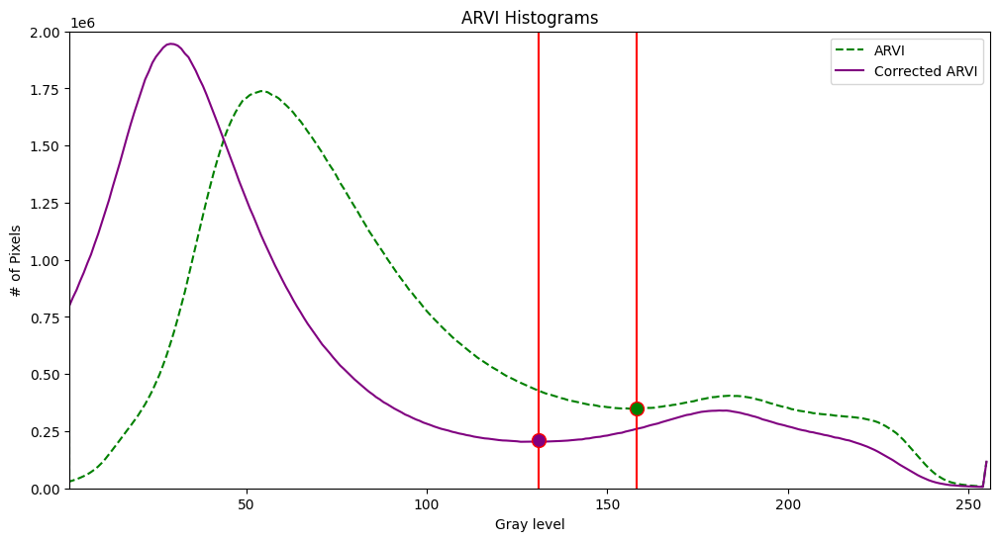

In [ ]:
x = np.linspace(0, 255, 256)
plt.figure(figsize=(12, 6))
ax = plt.gca()
ax.set_prop_cycle(color=['green', 'purple'])

#plt.subplot(1, 2, 1)
#plt.plot(_hist[1:])
plt.plot(x, _hist, linestyle='dashed')
plt.plot(x, _hist2, linestyle='solid')
plt.xlim([1, 256])
plt.ylim([0, 0.2*10**7])
plt.xlabel('Gray level')
plt.ylabel("# of Pixels")
plt.title('ARVI Histograms')
#plt.subplot(1, 2, 2)
#plt.plot(_hist2[1:])
#plt.ylabel("# of Pixels")
#plt.title('Corrected ARVI Histogram')
#plt.yticks([])
plt.legend(labels=['ARVI', 'Corrected ARVI'])
plt.axvline(x = 158, color = 'r')
plt.axvline(x = 131, color = 'r')
plt.plot(158, 0.35*10**6, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="green")
plt.plot(131, 0.21*10**6, marker="o", markersize=10, markeredgecolor="red", markerfacecolor="purple")
plt.savefig('histogramARVI')

In [ ]:
find_valleys(_hist2, 5)

[131]

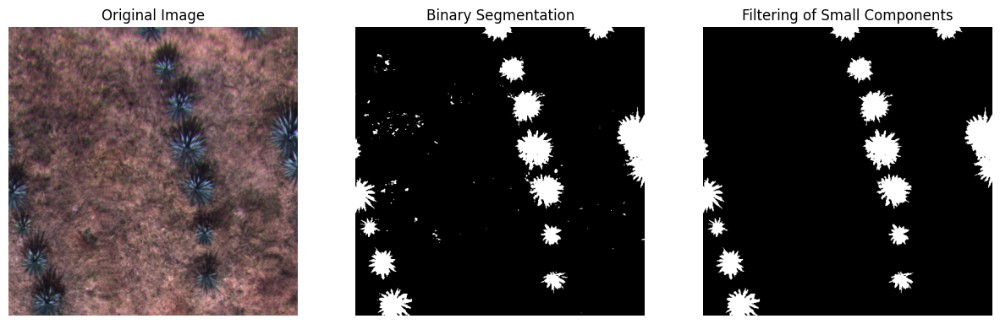

In [ ]:
plt.figure(figsize=(15, 5))

imN = '0626'
B, G, R, Re, NIR, t = read_channels(imN)
shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
Im = cv2.merge((B, G, R))
HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(HSV)
newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #131
newR, newG, newB = cv2.split(newI)
ARVI_1 =   VI((newB, newG, newR, Re, NIR), 'ARVI')

ret,image_result = cv2.threshold((255*ARVI_1).astype('uint8'),131,255,cv2.THRESH_BINARY)
out = filter_min_components(image_result, minSize=100, it_dilate=0, it_erode=0)

scale = 255/max(np.max(B), max(np.max(G), np.max(R)))
new = (scale*cv2.merge((R, G, B))).astype('uint8')
plt.subplot(1, 3, 1)
plt.imshow(new)
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image_result, cmap='gray')
plt.title('Binary Segmentation')
plt.axis('off')
plt.subplot(1, 3, 3)
plt.imshow(out, cmap='gray')
plt.title('Filtering of Small Components')
plt.axis('off')

#plt.savefig('segmentation.png')
Im = Image.fromarray(image_result) #convert to pil image
Im.save("binary_segmentation.png", "PNG") #save image
Im = Image.fromarray(255*out) #convert to pil image
Im.save("binary_segmentation_filtered.png", "PNG") #save image

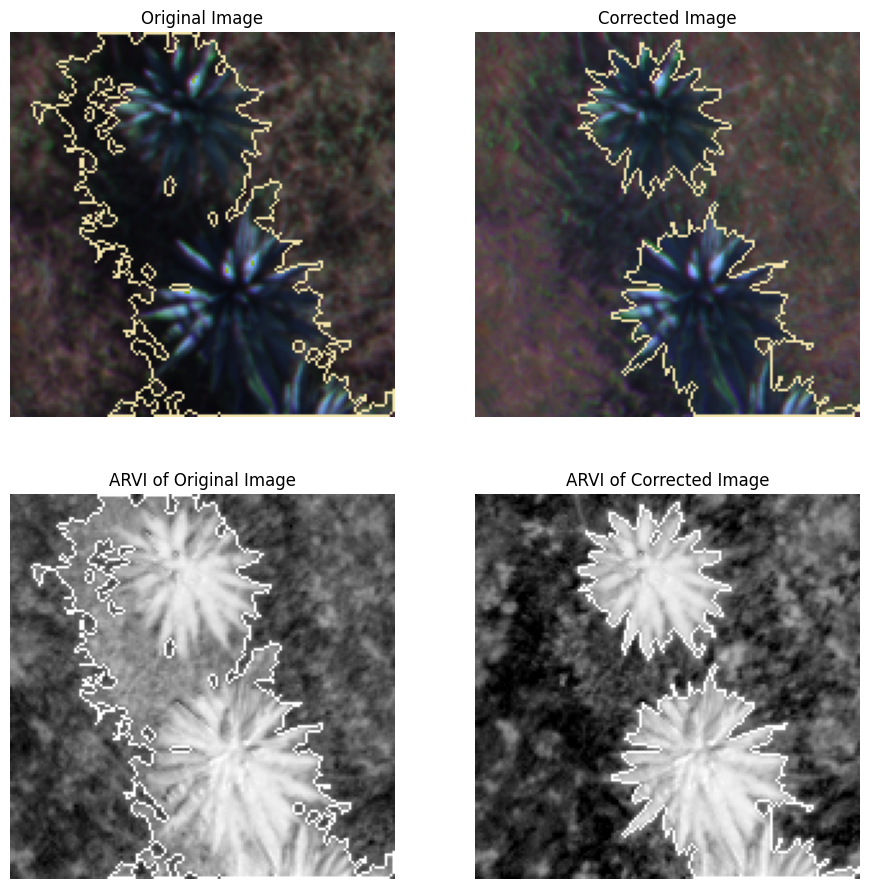

In [23]:
B, G, R, Re, NIR, t = read_channels('0216')
B = B[325:475, 150:300]
G = G[325:475, 150:300]
R = R[325:475, 150:300]
NIR = NIR[325:475, 150:300]
##Img 1
scale = 1.05*255/(max(R.max(), max(G.max(), B.max())))
rgb = (scale*cv2.merge((R, G, B))).astype('uint8')
#Img 2
shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
Im = cv2.merge((B, G, R))
HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
H, S, V = cv2.split(HSV)
newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB)
newR, newG, newB = cv2.split(newI)
scale = 255/(newI.max())
new = (scale*newI).astype('uint8')
#Img 3
ARVI = VI((B, G, R, Re, NIR),'ARVI')
#Img 4
ARVI2 = VI((newB, newG, newR, Re, NIR),'ARVI')
#seg1
ret,seg = cv2.threshold((255*ARVI).astype('uint8'),131,255,cv2.THRESH_BINARY)
seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)
contours, hierarchy = cv2.findContours(seg, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
threshold_area = 10     #threshold area
newContours1=[]
for cnt in contours:
  newContours1.append(cnt) if cv2.contourArea(cnt) > threshold_area else newContours1
cv2.drawContours(ARVI, newContours1, -1, (1, 0, 0), 1)
cv2.drawContours(rgb, newContours1, -1, (243, 229, 171), 1)
#seg2
ret,seg = cv2.threshold((255*ARVI2).astype('uint8'),131,255,cv2.THRESH_BINARY)
seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)
contours, hierarchy = cv2.findContours(seg, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
threshold_area = 10     #threshold area
newContours2=[]
for cnt in contours:
  newContours2.append(cnt) if cv2.contourArea(cnt) > threshold_area else newContours2
cv2.drawContours(ARVI2, newContours2, -1, (1, 0, 0), 1)
cv2.drawContours(new, newContours2, -1, (243, 229, 171), 1)

plt.figure(figsize=(11, 11))
plt.subplot(2, 2, 1)
#rgb = cv2.cvtColor(rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(rgb)
plt.title('Original Image')
plt.axis('off')
plt.subplot(2, 2, 2)
plt.imshow(new)
plt.title('Corrected Image')
plt.axis('off')
plt.subplot(2, 2, 3)
plt.imshow(ARVI, cmap='gray')
plt.title('ARVI of Original Image')
plt.axis('off')
plt.subplot(2, 2, 4)
plt.imshow(ARVI2, cmap='gray')
plt.title('ARVI of Corrected Image')
plt.axis('off')
#plt.savefig('example.png')

Im = Image.fromarray(rgb) #convert to pil image
Im.save("rgb_border.png", "PNG") #save image
Im = Image.fromarray(new) #convert to pil image
Im.save("rgb_corrected_border.png", "PNG") #save image
Im = Image.fromarray(((255*ARVI)/ARVI.max()).astype('uint8')) #convert to pil image
Im.save("arvi_border.png", "PNG") #save image
Im = Image.fromarray(((255*ARVI2)/ARVI2.max()).astype('uint8')) #convert to pil image
Im.save("arvi_corrected_border.png", "PNG") #save image

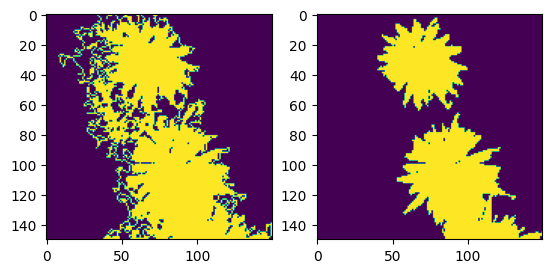

In [ ]:
ret,seg = cv2.threshold((255*ARVI).astype('uint8'),158,255,cv2.THRESH_BINARY)
seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)
plt.subplot(1, 2, 1)
plt.imshow(seg)
plt.subplot(1, 2, 2)
ret,seg = cv2.threshold((255*ARVI2).astype('uint8'),131,255,cv2.THRESH_BINARY)
seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)
plt.imshow(seg)

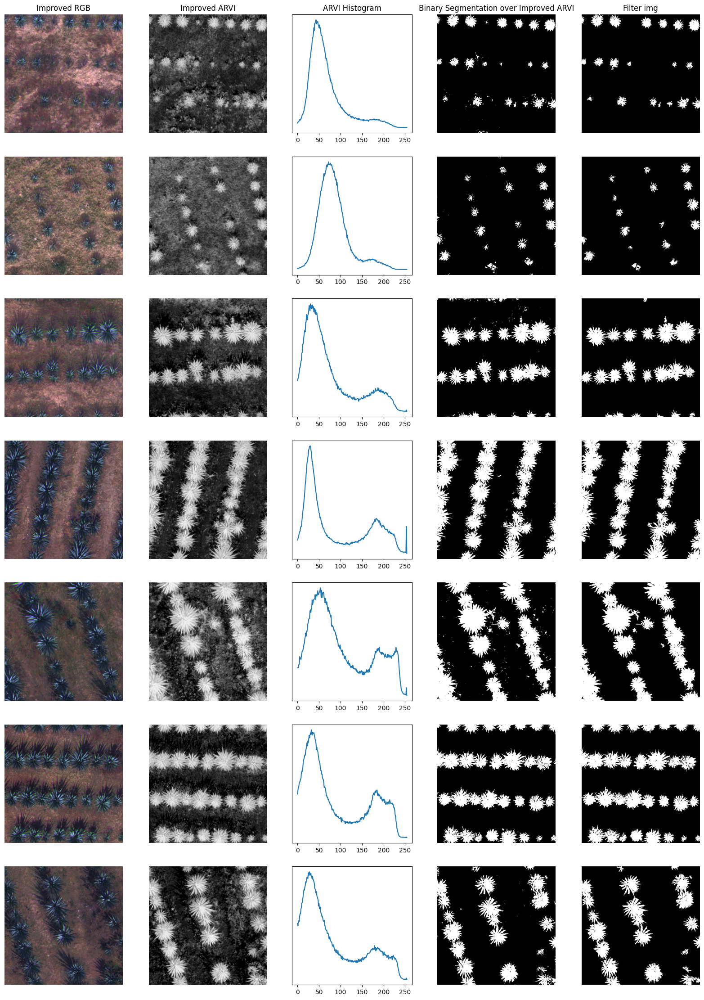

In [ ]:
#im = ['0028', '0152', '0201', '0218', '0416', '0441','0521', '0872', '0896', '1034']
im = ['0971', '0624', '0704', '0412', '0216', '0896', '0152']
plt.figure(figsize=(5*4,len(im)*4))
for i in range(len(im)):
  B, G, R, Re, NIR, target = read_channels(im[i])
  U = get_shadow_map(B, G, R, NIR, bin=False)
  scale=255/max(B.max(), max(R.max(), G.max()))
  rgb = (scale*cv2.merge((R, G, B))).astype('uint8')

  Im = cv2.merge((B, G, R))
  HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
  H, S, V = cv2.split(HSV)
  newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-U)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB)
  newR, newG, newB = cv2.split(newI)
  scale = 255/(newI.max())
  new = (scale*newI).astype('uint8')
  plt.subplot(len(im), 5, 5*i+1)
  plt.imshow(new)
  if i==0:
    plt.title('Improved RGB')
  plt.axis('off')

  ARVI2 = VI((newB, newG, newR, Re, NIR),'ARVI')
  plt.subplot(len(im), 5, 5*i+2)
  plt.imshow(ARVI2, cmap='gray')
  if i==0:
    plt.title('Improved ARVI')
  plt.axis('off')

  tmp_hist = cv2.calcHist([(255*ARVI2).astype('uint8')], [0], None, [256], [0, 256])
  plt.subplot(len(im), 5, 5*i+3)
  plt.plot(tmp_hist[1:])
  if i==0:
    plt.title('ARVI Histogram')
  plt.yticks([])

  valleys = find_valleys(tmp_hist, 3)
  thr = 158
  newT = find_nearest(valleys, value=thr)
  if abs(newT-thr) < 20:
    thr = newT
  ret,seg = cv2.threshold((255*ARVI2).astype('uint8'),thr,255,cv2.THRESH_BINARY)
  plt.subplot(len(im), 5, 5*i+4)
  plt.imshow(seg, cmap='gray')
  if i==0:
    plt.title('Binary Segmentation over Improved ARVI')
  plt.axis('off')

  seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)
  plt.subplot(len(im), 5, 5*i+5)
  plt.imshow(seg, cmap='gray')
  if i==0:
    plt.title('Filter img')
  plt.axis('off')

plt.savefig('SegmentedExamples.png')

#<font color= Blue>Scores</font>

In [ ]:
imNs = ['0028', '0152', '0201', '0218', '0416', '0441','0521', '0872', '0896', '1034']
classes = ('background', 'agave')
y = np.zeros( (len(imNs), 500, 500, 1) )
y_pred1 = np.zeros( (len(imNs), 500, 500, 1) )
for i in range(len(imNs)):
  imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)
  target = np.array(PIL.Image.open(imN+'.png'))

  ARVI =   VI((B, G, R, Re, NIR),'ARVI')
  #seg = seg_VI(ARVI, 158, it_dilate=0, it_erode=0)
  tmp_hist = cv2.calcHist([(255*ARVI).astype('uint8')], [0], None, [256], [0, 256])
  valleys = find_valleys(tmp_hist, 3)
  thr = 158
  newT = find_nearest(valleys, value=thr)
  if abs(newT-thr) < 20:
    thr = newT

  ret,seg = cv2.threshold((255*ARVI).astype('uint8'),thr,255,cv2.THRESH_BINARY)
  seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)

  y[i] = target.reshape(500,500,1)
  y_pred1[i] = seg.reshape(500,500,1)

y = y.reshape(-1)
y_pred1 = y_pred1.reshape(-1)

confusion_mat = confusion_matrix(y, y_pred1, labels=list(range(len(classes))))

data = []
_metrics = metrics(confusion_mat)
Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
dice = 100*(2*tp)/(2*tp+fp+fn)
data.append([Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
#print('Scores Weighted HCM Votes')
#print("Acc: %2.2f \nSoil Acc: %2.2f \nAgave Acc: %2.2f \nSoil IoU: %2.2f \nAgave IoU: %2.2f \nPrecision: %2.2f \nTN: %d \nFP: %d \nFN: %d \nTP: %d" %(Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, tn, fp, fn, tp))

df = pd.DataFrame(data, columns=['Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)', 'IoU_soil', 'IoU_Agave', 'Precision','DICE', 'TN', 'FP', 'FN', 'TP'], index = ['ARVI'])
df

,Acc,Acc_soil (Specificity),Acc_Agave (Recall),IoU_soil,IoU_Agave,Precision,DICE,TN,FP,FN,TP
ARVI,95.47108,96.203408,92.185278,94.5565,78.767609,84.403465,88.122909,1966744,77616,35607,420033


In [ ]:
imNs = ['0028', '0152', '0201', '0218', '0416', '0441','0521', '0872', '0896', '1034']

classes = ('background', 'agave')
y = np.zeros( (len(imNs), 500, 500, 1) )
y_pred1 = np.zeros( (len(imNs), 500, 500, 1) )
for i in range(len(imNs)):
  imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)
  target = np.array(PIL.Image.open(imN+'.png'))
  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  B_aux = B/shadow_map
  G_aux = G/shadow_map
  R_aux = R/shadow_map
  Re_aux = Re/shadow_map
  NIR_aux = NIR/shadow_map

  ARVI_ =   VI((B_aux, G_aux, R_aux, Re_aux, NIR_aux), 'ARVI')
  #seg = seg_VI(ARVI_, 160, it_dilate=0, it_erode=0)
  tmp_hist = cv2.calcHist([(255*ARVI_).astype('uint8')], [0], None, [256], [0, 256])
  valleys = find_valleys(tmp_hist, 3)
  thr = 160
  newT = find_nearest(valleys, value=thr)
  if abs(newT-thr) < 20:
    thr = newT
  ret,seg = cv2.threshold((255*ARVI_).astype('uint8'),thr,255,cv2.THRESH_BINARY)
  seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)

  y[i] = target.reshape(500,500,1)
  y_pred1[i] = seg.reshape(500,500,1)

y = y.reshape(-1)
y_pred1 = y_pred1.reshape(-1)

confusion_mat = confusion_matrix(y, y_pred1, labels=list(range(len(classes))))

#data = []
_metrics = metrics(confusion_mat)
Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
dice = 100*(2*tp)/(2*tp+fp+fn)
data.append([Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
#print('Scores Weighted HCM Votes')
#print("Acc: %2.2f \nSoil Acc: %2.2f \nAgave Acc: %2.2f \nSoil IoU: %2.2f \nAgave IoU: %2.2f \nPrecision: %2.2f \nTN: %d \nFP: %d \nFN: %d \nTP: %d" %(Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, tn, fp, fn, tp))

df = pd.DataFrame(data, columns=['Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)', 'IoU_soil', 'IoU_Agave', 'Precision', 'DICE', 'TN', 'FP', 'FN', 'TP'], index = ['ARVI', 'over Shadow_map'])
df

,Acc,Acc_soil (Specificity),Acc_Agave (Recall),IoU_soil,IoU_Agave,Precision,DICE,TN,FP,FN,TP
ARVI,95.47108,96.203408,92.185278,94.556500,78.767609,84.403465,88.122909,1966744,77616,35607,420033
over Shadow_map,95.81140,96.997740,90.488544,94.984188,79.746314,87.042491,88.732072,1982983,61377,43338,412302


In [ ]:
#with open('/content/Agaves500/splits/train.txt') as f:
#  images = f.read().splitlines()

imNs = ['0028', '0152', '0201', '0218', '0416', '0441','0521', '0872', '0896', '1034']

classes = ('background', 'agave')
y = np.zeros( (len(imNs), 500, 500, 1) )
y_pred1 = np.zeros( (len(imNs), 500, 500, 1) )
for i in range(len(imNs)):
  imN = imNs[i]
#for i in range(300):
#  imN = images[i]
  B, G, R, Re, NIR, t = read_channels(imN)
  target = t

  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  ret,shadow_map = cv2.threshold(shadow_map,70/255,1,cv2.THRESH_BINARY_INV)

  ARVI_ =   VI((B, G, R, Re, NIR), 'ARVI')
  #seg = seg_VI(ARVI_, 158, it_dilate=0, it_erode=0)
  tmp_hist = cv2.calcHist([(255*ARVI_).astype('uint8')], [0], None, [256], [0, 256])
  valleys = find_valleys(tmp_hist, 3)
  thr = 160
  newT = find_nearest(valleys, value=thr)
  if abs(newT-thr) < 20:
    thr = newT
  ret,seg = cv2.threshold((255*ARVI_).astype('uint8'),thr,255,cv2.THRESH_BINARY)
  seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)
  seg = np.logical_and(1-shadow_map, seg).astype('uint8')

  y[i] = target.reshape(500,500,1)
  y_pred1[i] = seg.reshape(500,500,1)

y = y.reshape(-1)
y_pred1 = y_pred1.reshape(-1)

confusion_mat = confusion_matrix(y, y_pred1, labels=list(range(len(classes))))

#data = []
_metrics = metrics(confusion_mat)
Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
dice = 100*(2*tp)/(2*tp+fp+fn)
data.append([Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
#print('Scores Weighted HCM Votes')
#print("Acc: %2.2f \nSoil Acc: %2.2f \nAgave Acc: %2.2f \nSoil IoU: %2.2f \nAgave IoU: %2.2f \nPrecision: %2.2f \nTN: %d \nFP: %d \nFN: %d \nTP: %d" %(Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, tn, fp, fn, tp))

df = pd.DataFrame(data, columns=['Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)', 'IoU_soil', 'IoU_Agave', 'Precision', 'DICE', 'TN', 'FP', 'FN', 'TP'], index = ['ARVI','over Shadow_map', 'remove shadows'])
df

,Acc,Acc_soil (Specificity),Acc_Agave (Recall),IoU_soil,IoU_Agave,Precision,DICE,TN,FP,FN,TP
ARVI,95.471080,96.203408,92.185278,94.556500,78.767609,84.403465,88.122909,1966744,77616,35607,420033
over Shadow_map,95.811400,96.997740,90.488544,94.984188,79.746314,87.042491,88.732072,1982983,61377,43338,412302
remove shadows,95.382665,98.299612,80.348340,94.689300,73.874006,90.165201,84.974180,1943460,33618,75382,308209


In [ ]:
imNs = ['0028', '0152', '0201', '0218', '0416', '0441','0521', '0872', '0896', '1034']

classes = ('background', 'agave')
y = np.zeros( (len(imNs), 500, 500, 1) )
y_pred1 = np.zeros( (len(imNs), 500, 500, 1) )
for i in range(len(imNs)):
  imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)
  target = np.array(PIL.Image.open(imN+'.png'))
  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  Im = cv2.merge((B, G, R))
  HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
  H, S, V = cv2.split(HSV)

  #newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V/shadow_map, V.min(), V.max()))), cv2.COLOR_HSV2RGB) #135
  #newI = cv2.cvtColor(cv2.merge((H, S, V*(1+1-shadow_map) )), cv2.COLOR_HSV2RGB) #142
  newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #131
  #newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+3*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #126
  #newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+5*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #115

  newR, newG, newB = cv2.split(newI)
  ARVI_ =   VI((newB, newG, newR, Re, NIR), 'ARVI')
  #seg = seg_VI(ARVI_, 131, it_dilate=0, it_erode=0)
  tmp_hist = cv2.calcHist([(255*ARVI_).astype('uint8')], [0], None, [256], [0, 256])
  valleys = find_valleys(tmp_hist, 3)
  thr = 131
  newT = find_nearest(valleys, value=thr)
  if abs(newT-thr) < 20:
    thr = newT
  print(thr)
  ret,seg = cv2.threshold((255*ARVI_).astype('uint8'),thr,255,cv2.THRESH_BINARY)
  seg = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)

  contours, hierarchy = cv2.findContours(seg, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  threshold_area = 10     #threshold area
  newContours=[]
  for cnt in contours:
    newContours.append(cnt) if cv2.contourArea(cnt) > threshold_area else newContours
  contours = newContours
  seg = cv2.drawContours(np.zeros_like(seg), contours, -1, (1), thickness=cv2.FILLED)

  y[i] = target.reshape(500,500,1)
  y_pred1[i] = seg.reshape(500,500,1)

y = y.reshape(-1)
y_pred1 = y_pred1.reshape(-1)

confusion_mat = confusion_matrix(y, y_pred1, labels=list(range(len(classes))))

#data = []
_metrics = metrics(confusion_mat)
Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
dice = 100*(2*tp)/(2*tp+fp+fn)
data.append([Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
#print('Scores Weighted HCM Votes')
#print("Acc: %2.2f \nSoil Acc: %2.2f \nAgave Acc: %2.2f \nSoil IoU: %2.2f \nAgave IoU: %2.2f \nPrecision: %2.2f \nTN: %d \nFP: %d \nFN: %d \nTP: %d" %(Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, tn, fp, fn, tp))

#df = pd.DataFrame(data, columns=['Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)',  'IoU_soil', 'IoU_Agave', 'Precision', 'TN', 'FP', 'FN', 'TP'], index = ['ARVI', 'HCM', 'Shadow Improved', 'over Shadow_map', 'remove shadows', 'shadow map HSV'])
#df = pd.DataFrame(data, columns=['Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)',  'IoU_soil', 'IoU_Agave', 'Precision',  'TN', 'FP', 'FN', 'TP'], index = ['Shadow 1', 'Shadow 2', 'Shadow 3', 'Shadow 4', 'Shadow 5'])
df = pd.DataFrame(data, columns=['Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)', 'IoU_soil', 'IoU_Agave', 'Precision', 'DICE', 'TN', 'FP', 'FN', 'TP'], index = ['ARVI', 'over Shadow_map', 'remove shadows', 'Shadow Improve HSV'])

df

131
131
132
127
131
130
133
137
127
119


,Acc,Acc_soil (Specificity),Acc_Agave (Recall),IoU_soil,IoU_Agave,Precision,DICE,TN,FP,FN,TP
ARVI,95.471080,96.203408,92.185278,94.556500,78.767609,84.403465,88.122909,1966744,77616,35607,420033
over Shadow_map,95.811400,96.997740,90.488544,94.984188,79.746314,87.042491,88.732072,1982983,61377,43338,412302
remove shadows,95.382665,98.299612,80.348340,94.689300,73.874006,90.165201,84.974180,1943460,33618,75382,308209
Shadow Improve HSV,97.526640,98.900389,91.362918,97.032510,87.067263,94.876540,93.086585,2021880,22480,39354,416286


In [ ]:
imNs = ['0028', '0152', '0201', '0218', '0416', '0441','0521', '0872', '0896', '1034']
classes = ('background', 'agave')
#y = np.zeros( (1, 500, 500, 1) )
#y_pred1 = np.zeros( (1, 500, 500, 1) )

data = []
for i in range(len(imNs)):
  imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)
  target = np.array(PIL.Image.open(imN+'.png'))

  ARVI =   VI((B, G, R, Re, NIR),'ARVI')
  ret,seg = cv2.threshold((255*ARVI).astype('uint8'),158,255,cv2.THRESH_BINARY)
  seg1 = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)

  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  ret,shadow_map = cv2.threshold(shadow_map,70/255,1,cv2.THRESH_BINARY_INV)
  seg2 = np.logical_and(1-shadow_map, seg1).astype('uint8')

  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  Im = cv2.merge((B, G, R))
  HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
  H, S, V = cv2.split(HSV)
  newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #131
  newR, newG, newB = cv2.split(newI)
  ARVI_ =   VI((newB, newG, newR, Re, NIR), 'ARVI')
  ret,seg = cv2.threshold((255*ARVI_).astype('uint8'),131,255,cv2.THRESH_BINARY)
  seg3 = filter_min_components(seg, minSize=100, it_dilate=0, it_erode=0)

  #y[0] = target.reshape(500,500,1)
  #y_pred1[0] = seg.reshape(500,500,1)

  y = target.reshape(-1)
  y_pred1 = seg1.reshape(-1)
  confusion_mat = confusion_matrix(y, y_pred1, labels=list(range(len(classes))))
  _metrics = metrics(confusion_mat)
  Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
  dice = 100*(2*tp)/(2*tp+fp+fn)
  """
  data.append(['ARVI', Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
  """
  data.append(['Accuracy', 'ARVI', Acc])
  data.append(['Specificity', 'ARVI', classAcc[0]])
  data.append(['Recall', 'ARVI', classAcc[1]])
  data.append(['Precision', 'ARVI', precision])
  data.append(['IoU', 'ARVI', classIoU[1]])
  data.append(['Dice', 'ARVI', dice])

  y_pred2 = seg2.reshape(-1)
  confusion_mat = confusion_matrix(y, y_pred2, labels=list(range(len(classes))))
  _metrics = metrics(confusion_mat)
  Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
  dice = 100*(2*tp)/(2*tp+fp+fn)
  """
  data.append(['Shadow Remotion on ARVI', Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
  """
  data.append(['Accuracy', 'Shadow Remotion on ARVI', Acc])
  data.append(['Specificity', 'Shadow Remotion on ARVI', classAcc[0]])
  data.append(['Recall', 'Shadow Remotion on ARVI', classAcc[1]])
  data.append(['Precision', 'Shadow Remotion on ARVI', precision])
  data.append(['IoU', 'Shadow Remotion on ARVI', classIoU[1]])
  data.append(['Dice', 'Shadow Remotion on ARVI', dice])

  y_pred3 = seg3.reshape(-1)
  confusion_mat = confusion_matrix(y, y_pred3, labels=list(range(len(classes))))
  _metrics = metrics(confusion_mat)
  Acc, classAcc, classIoU, precision, tn, fp, fn, tp = _metrics
  dice = 100*(2*tp)/(2*tp+fp+fn)
  """
  data.append(['Improved ARVI', Acc, classAcc[0], classAcc[1], classIoU[0], classIoU[1], precision, dice, tn, fp, fn, tp])
  """
  data.append(['Accuracy', 'Improved ARVI', Acc])
  data.append(['Specificity', 'Improved ARVI', classAcc[0]])
  data.append(['Recall', 'Improved ARVI', classAcc[1]])
  data.append(['Precision', 'Improved ARVI', precision])
  data.append(['IoU', 'Improved ARVI', classIoU[1]])
  data.append(['Dice', 'Improved ARVI', dice])

#df = pd.DataFrame(data, columns=['Segmented Image','Acc', 'Acc_soil (Specificity)', 'Acc_Agave (Recall)', 'IoU_soil', 'IoU_Agave', 'Precision','DICE', 'TN', 'FP', 'FN', 'TP'])
df = pd.DataFrame(data, columns=['Metric','Method', 'Score'])
df

,Metric,Method,Score
0,Accuracy,ARVI,98.773600
1,Specificity,ARVI,99.877569
2,Recall,ARVI,52.128028
3,Precision,ARVI,90.972222
4,IoU,ARVI,49.564073
...,...,...,...
175,Specificity,Improved ARVI,97.708113
176,Recall,Improved ARVI,87.312874
177,Precision,Improved ARVI,55.791152
178,IoU,Improved ARVI,51.607433


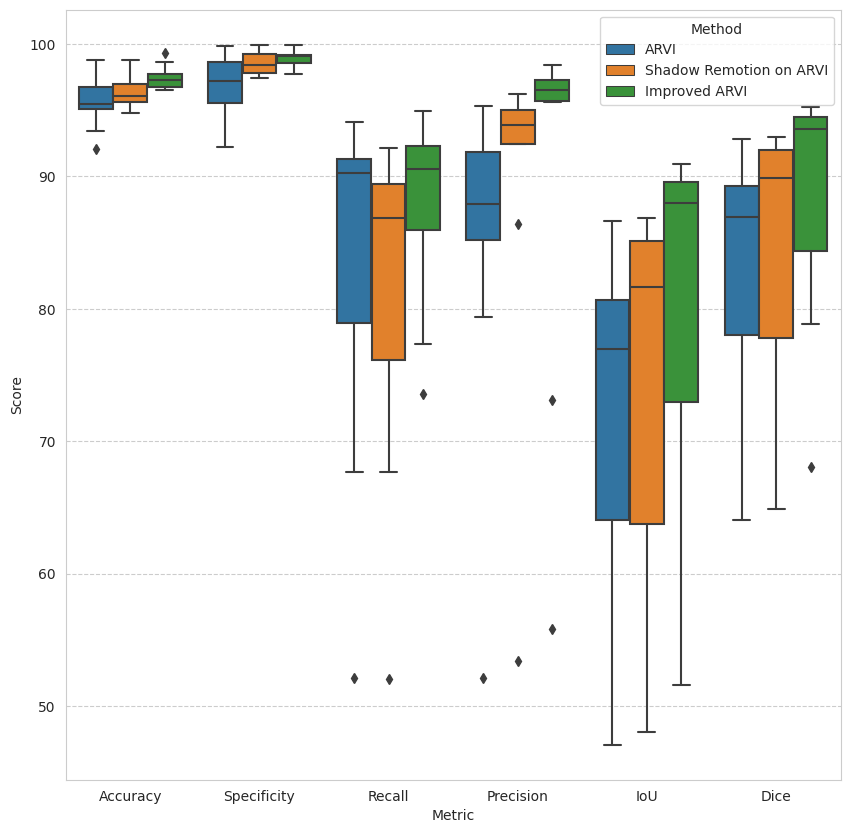

In [ ]:
plt.figure(figsize=(10,10))
ax = sb.boxplot(x="Metric", y="Score", hue="Method", data=df)  # RUN PLOT
sb.set_style("whitegrid", {'grid.linestyle': '--'})
plt.savefig('boxplot_results.png')

#<font color= Blue>Extras</font>

In [ ]:
imNs = ['0028', '0201', '0218', '0441', '0896']
imNs = ['0521', '0152', '1034', '0416', '0872']
#imNs = ['0896']

lenN = len(imNs)
for i in range(lenN):
  imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)

  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  Im = cv2.merge((B, G, R))
  HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
  H, S, V = cv2.split(HSV)

  newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #131

  newR, newG, newB = cv2.split(newI)
  ARVI_1 =   VI((newB, newG, newR, Re, NIR), 'ARVI')
  #seg1 = seg_VI(ARVI_1, 131, it_dilate=0, it_erode=0)
  ret,seg1 = cv2.threshold((255*ARVI_1).astype('uint8'),131,255,cv2.THRESH_BINARY)
  seg1 = filter_min_components(seg1, minSize=100, it_dilate=0, it_erode=0)

  contours, hierarchy = cv2.findContours(seg1,  cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
  threshold_area = 10     #threshold area
  newContours=[]
  for cnt in contours:
    newContours.append(cnt) if cv2.contourArea(cnt) > threshold_area else newContours#print(cv2.contourArea(cnt))
  #cv2.drawContours(ARVI_1, newContours, -1, (1, 0, 0), 1)

  IMG = (255*newI/newI.max()).astype('uint8')
  IMG2 = (255*ARVI_1/ARVI_1.max()).astype('uint8')
  IMG = cv2.drawContours(IMG, newContours, -1, (255, 0, 0), 1)
  IMG2 = cv2.drawContours(IMG2, newContours, -1, (255, 0, 0), 1)
  im = Image.fromarray(IMG) #convert to pil image
  im2 = Image.fromarray(IMG2) #convert to pil image
  im.save(imN+".png", "PNG") #save image
  im2.save(imN+"_arvi.png", "PNG") #save image

In [ ]:
###Histogram flatness measure (HFM)
Names = ['ARVI', 'Corrected ARVI']
P = np.ones(len(Names))
S = np.zeros(len(Names))
HFM = np.zeros(len(Names))
n = 256

for p in _hist:
  if p==0:
    continue
  P[0]*=(p/(10**4.8))
  S[0]+=(p/(10**4.8))

for p in _hist2:
  if p==0:
    continue
  P[1]*=(p/(10**4.8))
  S[1]+=(p/(10**4.8))

for i in range(len(Names)):
  HFM[i] = (np.power(P[i], 1/n))/(S[i]/n)

for i in reversed(np.argsort(HFM)):
  print("%10s:%.4f" %(Names[i], HFM[i]))

      ARVI:0.5983
Corrected ARVI:0.4836


In [ ]:
### Histogram Spread (HS)
tmp_hist_cumulative = np.zeros((len(Names),len_histo-1, 1))
tmp_hist = np.zeros((len(Names),len_histo-1, 1))
tmp_hist[0] = _hist[1:]
tmp_hist[1] = _hist2[1:]
quartil1 = np.zeros((len(Names)))
quartil3 = np.zeros((len(Names)))
totalNpixels = 1232*500*500 #number of images*size NxM of the images
q1 = totalNpixels/4
q3 = 3*totalNpixels/4
HS = np.zeros(len(Names))

for i in range(len(Names)):
  tmp_hist_cumulative[i][0] = _histo[i][1]
  flag_q1 = False
  flag_q3 = False
  for j in range(1, len(tmp_hist[i])-1): #-1 to dischard the 0 values in dataset
    tmp_hist_cumulative[i][j] = tmp_hist_cumulative[i][j-1] + tmp_hist[i][j+1]
    if tmp_hist_cumulative[i][j] > q1 and flag_q1 == False:
      quartil1[i] = j
      flag_q1 = True
    if tmp_hist_cumulative[i][j] > q3 and flag_q3 == False:
      quartil3[i] = j
      flag_q3 = True

for i in range(len(Names)):
  HS[i] = (quartil3[i]-quartil1[i])/256

for i in reversed(np.argsort(HS)):
  print("%10s:%.4f" %(Names[i], HS[i]))

Corrected ARVI:-0.1953
      ARVI:-0.2969


In [ ]:
norm = False
RVI = VI((B, G, R, Re, NIR), 'RVI', norm)
VIN = VI((B, G, R, Re, NIR), 'VIN', norm)
NDVI = VI((B, G, R, Re, NIR), 'NDVI', norm)
PVI1 = VI((B, G, R, Re, NIR), 'PVI1', norm)
PVI2 = VI((B, G, R, Re, NIR), 'PVI2', norm)
SAVI = VI((B, G, R, Re, NIR), 'SAVI', norm)
TSAVI1 = VI((B, G, R, Re, NIR), 'TSAVI1', norm)
TSAVI2 = VI((B, G, R, Re, NIR), 'TSAVI2', norm)
NDGI = VI((B, G, R, Re, NIR), 'NDGI', norm)
RI = VI((B, G, R, Re, NIR), 'RI', norm)
RI_NDVI = VI((B, G, R, Re, NIR), 'RI_NDVI', norm)
RI_SAVI = VI((B, G, R, Re, NIR), 'RI_SAVI', norm)
ARVI = VI((B, G, R, Re, NIR), 'ARVI', norm)
NDCI = VI((B, G, R, Re, NIR), 'NDCI', norm)
MSAVI = VI((B, G, R, Re, NIR), 'MSAVI', norm)
NLI = VI((B, G, R, Re, NIR), 'NLI', norm)
RDVI = VI((B, G, R, Re, NIR), 'RDVI', norm)
GNDVI = VI((B, G, R, Re, NIR), 'GNDVI', norm)
OSAVI = VI((B, G, R, Re, NIR), 'OSAVI', norm)
MSR = VI((B, G, R, Re, NIR), 'MSR', norm)
MCARI = VI((B, G, R, Re, NIR), 'MCARI', norm)
NDRE = VI((B, G, R, Re, NIR), 'NDRE', norm)
NDWI = VI((B, G, R, Re, NIR), 'NDWI', norm)
SIPI = VI((B, G, R, Re, NIR), 'SIPI', norm)
TVI = VI((B, G, R, Re, NIR), 'TVI', norm)
ARI = VI((B, G, R, Re, NIR), 'ARI', norm)
EVI = VI((B, G, R, Re, NIR), 'EVI', norm)
CIVE = VI((B, G, R, Re, NIR), 'CIVE', norm)
NRI = VI((B, G, R, Re, NIR), 'NRI', norm)
NGI = VI((B, G, R, Re, NIR), 'NGI', norm)
NBI = VI((B, G, R, Re, NIR), 'NBI', norm)
CCCI = VI((B, G, R, Re, NIR), 'CCCI', norm)
EVI2 = VI((B, G, R, Re, NIR), 'EVI2', norm)
ExG = VI((B, G, R, Re, NIR), 'ExG', norm)
ExR = VI((B, G, R, Re, NIR), 'ExR', norm)

B2 = newB
G2 = newG
R2 = newR
Re2 = Re
NIR2 = NIR
RVI2 = VI((B2, G2, R2, Re2, NIR2), 'RVI', norm)
VIN2 = VI((B2, G2, R2, Re2, NIR2), 'VIN', norm)
NDVI2 = VI((B2, G2, R2, Re2, NIR2), 'NDVI', norm)
PVI12 = VI((B2, G2, R2, Re2, NIR2), 'PVI1', norm)
PVI22 = VI((B2, G2, R2, Re2, NIR2), 'PVI2', norm)
SAVI2 = VI((B2, G2, R2, Re2, NIR2), 'SAVI', norm)
TSAVI12 = VI((B2, G2, R2, Re2, NIR2), 'TSAVI1', norm)
TSAVI22 = VI((B2, G2, R2, Re2, NIR2), 'TSAVI2', norm)
NDGI2 = VI((B2, G2, R2, Re2, NIR2), 'NDGI', norm)
RI2 = VI((B2, G2, R2, Re2, NIR2), 'RI', norm)
RI_NDVI2 = VI((B2, G2, R2, Re2, NIR2), 'RI_NDVI', norm)
RI_SAVI2 = VI((B2, G2, R2, Re2, NIR2), 'RI_SAVI', norm)
ARVI2 = VI((B2, G2, R2, Re2, NIR2), 'ARVI', norm)
NDCI2 = VI((B2, G2, R2, Re2, NIR2), 'NDCI', norm)
MSAVI2 = VI((B2, G2, R2, Re2, NIR2), 'MSAVI', norm)
NLI2 = VI((B2, G2, R2, Re2, NIR2), 'NLI', norm)
RDVI2 = VI((B2, G2, R2, Re2, NIR2), 'RDVI', norm)
GNDVI2 = VI((B2, G2, R2, Re2, NIR2), 'GNDVI', norm)
OSAVI2 = VI((B2, G2, R2, Re2, NIR2), 'OSAVI', norm)
MSR2 = VI((B2, G2, R2, Re2, NIR2), 'MSR', norm)
MCARI2 = VI((B2, G2, R2, Re2, NIR2), 'MCARI', norm)
NDRE2 = VI((B2, G2, R2, Re2, NIR2), 'NDRE', norm)
NDWI2 = VI((B2, G2, R2, Re2, NIR2), 'NDWI', norm)
SIPI2 = VI((B2, G2, R2, Re2, NIR2), 'SIPI', norm)
TVI2 = VI((B2, G2, R2, Re2, NIR2), 'TVI', norm)
ARI2 = VI((B2, G2, R2, Re2, NIR2), 'ARI', norm)
EVI2 = VI((B2, G2, R2, Re2, NIR2), 'EVI', norm)
CIVE2 = VI((B2, G2, R2, Re2, NIR2), 'CIVE', norm)
NRI2 = VI((B2, G2, R2, Re2, NIR2), 'NRI', norm)
NGI2 = VI((B2, G2, R2, Re2, NIR2), 'NGI', norm)
NBI2 = VI((B2, G2, R2, Re2, NIR2), 'NBI', norm)
CCCI2 = VI((B2, G2, R2, Re2, NIR2), 'CCCI', norm)
EVI22 = VI((B2, G2, R2, Re2, NIR2), 'EVI2', norm)
ExG2 = VI((B2, G2, R2, Re2, NIR2), 'ExG', norm)
ExR2 = VI((B2, G2, R2, Re2, NIR2), 'ExR', norm)

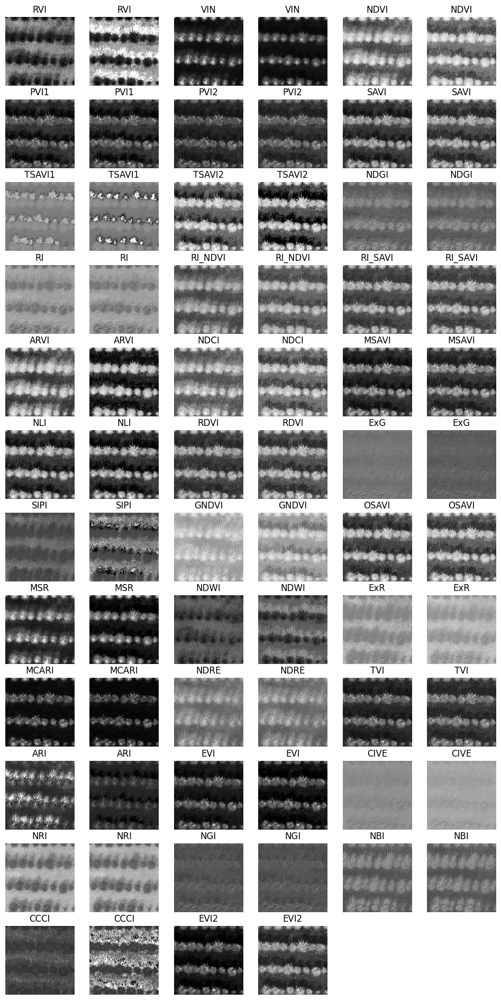

In [ ]:
Veg_Names = ['RVI', 'VIN', 'NDVI', 'PVI1', 'PVI2', 'SAVI', 'TSAVI1', 'TSAVI2',
             'NDGI', 'RI', 'RI_NDVI', 'RI_SAVI', 'ARVI', 'NDCI', 'MSAVI', 'NLI',
             'RDVI', 'ExG', 'SIPI', 'GNDVI', 'OSAVI', 'MSR', 'NDWI', 'ExR', 'MCARI',
             'NDRE', 'TVI', 'ARI', 'EVI', 'CIVE', 'NRI', 'NGI', 'NBI', 'CCCI', 'EVI2']
Veg_Ind = [RVI, VIN, NDVI, PVI1, PVI2, SAVI, TSAVI1, TSAVI2,
          NDGI, RI, RI_NDVI, RI_SAVI, ARVI, NDCI, MSAVI, NLI,
          RDVI, ExG, SIPI, GNDVI, OSAVI, MSR, NDWI, ExR, MCARI,
          NDRE, TVI, ARI, EVI, CIVE, NRI, NGI, NBI, CCCI, EVI2]
Veg_Ind2 = [RVI2, VIN2, NDVI2, PVI12, PVI22, SAVI2, TSAVI12, TSAVI22,
          NDGI2, RI2, RI_NDVI2, RI_SAVI2, ARVI2, NDCI2, MSAVI2, NLI2,
          RDVI2, ExG2, SIPI2, GNDVI2, OSAVI2, MSR2, NDWI2, ExR2, MCARI2,
          NDRE2, TVI2, ARI2, EVI2, CIVE2, NRI2, NGI2, NBI2, CCCI2, EVI22]

rows = 12
cols = 6
plt.figure(figsize=(12, 24))

for i in range(len(Veg_Ind)):
  plt.subplot(rows, cols, 2*i+1)
  plt.imshow(Veg_Ind[i], cmap="gray")
  plt.title(Veg_Names[i])
  plt.axis('off')

  plt.subplot(rows, cols, 2*i+2)
  plt.imshow(Veg_Ind2[i], cmap="gray")
  plt.title(Veg_Names[i])
  plt.axis('off')

plt.savefig("examplePlotVI.png")

In [ ]:
import json

imNs = ['0028', '0201', '0218', '0441', '0896']
#imNs = ['0896']

lenN = len(imNs)
for i in range(lenN):
  imN = imNs[i]
  B, G, R, Re, NIR, t = read_channels(imN)

  shadow_map = get_shadow_map(B, G, R, NIR, bin=False) #shadows are the 1's
  Im = cv2.merge((B, G, R))
  HSV = cv2.cvtColor(Im,cv2.COLOR_BGR2HSV)
  H, S, V = cv2.split(HSV)
  newI = cv2.cvtColor(cv2.merge((H, S, np.clip(V*(1+2*(1-shadow_map)), V.min(), V.max()) )), cv2.COLOR_HSV2RGB) #130

  newR, newG, newB = cv2.split(newI)
  ARVI_1 =   VI((newB, newG, newR, Re, NIR), 'ARVI')
  #seg1 = seg_VI(ARVI_1, 131, it_dilate=0, it_erode=0)
  tmp_hist = cv2.calcHist([(255*ARVI_1).astype('uint8')], [0], None, [256], [0, 256])
  valleys = find_valleys(tmp_hist, 3)
  thr = 131
  newT = find_nearest(valleys, value=thr)
  if abs(newT-thr) < 20:
    thr = newT
  print(thr)
  ret,seg1 = cv2.threshold((255*ARVI_1).astype('uint8'),thr,255,cv2.THRESH_BINARY)
  seg1 = filter_min_components(seg1, minSize=100, it_dilate=0, it_erode=0)

  contours, hierarchy = cv2.findContours(seg1,  cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  threshold_area = 10     #threshold area
  #newContours=[]
  #for cnt in contours:
  #  newContours.append(cnt) if cv2.contourArea(cnt) > threshold_area else newContours
  #contours = newContours

  data = {}
  Null = 'null'
  data['shapes'] = []
  data['version'] = "5.3.1"
  data['flags'] = {}
  for i in range(len(contours)):
    cnt = (contours[i].reshape((contours[i].shape[0], 2)))
    data['shapes'].append({
      'label': 'Agave',
      'points': cnt.tolist(),
      "group_id": None,
      "description": "",
      "shape_type": "polygon",
      "flags": {}})
  data['imagePath'] = imN+'.png'
  data['imageData'] = ""
  data['imageHeight'] = 500
  data['imageWidth'] = 500

  with open(imN+'.json', 'w') as file:
      json.dump(data, file, indent=4)